# Background
As Jakarta continues to grow and urbanize, the need for efficient and accessible public transportation becomes more urgent. Transjakarta, as the city’s main public transportation provider, serves thousands of passengers daily. Its role is vital in supporting the daily mobility of Jakarta residents—especially those who rely on it for commuting to work, school, or other regular activities.

Despite the extensive reach of Transjakarta’s corridors, there are still areas across the city—particularly at its edges and in newer residential developments—that lack sufficient coverage. Expanding access to these underserved areas is key to ensuring that more people can benefit from safe, reliable, and sustainable public transport options.

# Problem
Transjakarta’s effectiveness as a transportation solution depends not only on the number of existing routes but also on how well they serve the everyday movement patterns of its users. To better support daily commuters, it’s important to:
	•	Understand who the Transjakarta passengers are and how they behave,
	•	Identify patterns in usage frequency, travel times, and peak periods,
	•	Explore the relationship between passenger activity and spatial coverage of stops.

This analysis aims to explore the current state of Transjakarta usage, identify any service gaps, and offer data-backed insights into areas where service could be improved—either by adding new stops or introducing new routes—based on user needs and behavioral trends.

This Exploratory Data Analysis's goals is to generate insights from passenger data that help evaluate Transjakarta’s current coverage and identify opportunities to improve service accessibility. The ultimate goal is to support decisions on strategic route or stop expansion that aligns with the way people actually move around the city. This analysis explores user behavior and usage patterns to assess Transjakarta’s current service reach and identify areas where additional stops or new routes may be beneficial.

**Dataset Variable Explanation**
1.	transID: Unique transaction id for every transaction
2.	payCardID: Customers main identifier. The card customers use as a ticket for entrance and exit.
3.	payCardBank: Customers card bank issuer name
4.	payCardName: Customers name that is embedded in the card.
5.	payCardSex: Customers sex that is embedded in the card
6.	payCardBirthDate: Customers birth year
7.	corridorID: Corridor ID / Route ID as key for route grouping.
8.	corridorName: Corridor Name / Route Name contains Start and Finish for each route.
9.	direction: 0 for Go, 1 for Back. Direction of the route.
10.	tapInStops: Tap In (entrance) Stops ID for identifying stops name
11.	tapInStopsName: Tap In (entrance) Stops Name where customers tap in.
12.	tapInStopsLat: Latitude of Tap In Stops
13.	tapInStopsLon: Longitude of Tap In Stops
14.	stopStartSeq: Sequence of the stops, 1st stop, 2nd stops etc. Related to direction.
15.	tapInTime: Time of tap in. Date and time
16.	tapOutStops: Tap Out (Exit) Stops ID for identifying stops name
17.	tapOutStopsName: Tap out (exit) Stops Name where customers tap out.
18.	tapOutStopsLat: Latitude of Tap Out Stops
19.	tapOutStopsLon: Longitude of Tap Out Stops
20.	stopEndSeq: Sequence of the stops, 1st stop, 2nd stops etc. Related to direction.
21.	tapOutTime: Time of tap out. Date and time
22.	payAmount: The number of what customers pay. Some are free. Some not.

In [212]:
#Import basic libraries
import numpy as np
import pandas as pd
from datetime import timedelta

#Data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap, MarkerCluster

#statistic test libraries
from scipy.stats import normaltest, pearsonr, spearmanr, ttest_ind, f_oneway, mannwhitneyu, kruskal, chisquare, chi2_contingency


## Dataset Understanding

In [213]:
#load the dataset
data = pd.read_csv('Transjakarta.csv')
data.head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0


In [214]:
#check the dataset size
print(f'The dataset has {data.shape[0]} rows and {data.shape[1]} columns')

The dataset has 37900 rows and 22 columns


In [215]:
#dataset basic information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   transID           37900 non-null  object 
 1   payCardID         37900 non-null  int64  
 2   payCardBank       37900 non-null  object 
 3   payCardName       37900 non-null  object 
 4   payCardSex        37900 non-null  object 
 5   payCardBirthDate  37900 non-null  int64  
 6   corridorID        36643 non-null  object 
 7   corridorName      35970 non-null  object 
 8   direction         37900 non-null  float64
 9   tapInStops        36687 non-null  object 
 10  tapInStopsName    37900 non-null  object 
 11  tapInStopsLat     37900 non-null  float64
 12  tapInStopsLon     37900 non-null  float64
 13  stopStartSeq      37900 non-null  int64  
 14  tapInTime         37900 non-null  object 
 15  tapOutStops       35611 non-null  object 
 16  tapOutStopsName   36556 non-null  object

Dataset Overview and Observations:
- The dataset contains 37900 rows and 22 columns with int, float, and object as their data types. However, not all columns behave exactly according to their data types.
- Some columns are detcted as numerical, but their values don't actually represent measurable numbers
- payCardID stores numberical combination to identify the payment card used by each passenger. This card isn't just used as payment method but also used as card access to enter or exit the bus stops.
- payCardBirthDate shows the year of birth of the card owner.
- direction stores value 0 and 1 to identify passenger direction of passenger (0 for Go and 1 for Back), so it's a categorical value in numeric format.
- tapInStopsLat, tapInStopsLon, tapOutStopsLat and tapOutStopsLon are coordinates that show the location of the bus stops where passenger tap in or out. These are numerical but not used for calculations.
- The numerical columns that actually contain measurable value are stopStartSeq-stopEndSeq, which represent the order of the halte in a route and can be used to calculate how far someone travels (we will add this counting to the dataset as a new column), and payAmount, which is the fare paid by the passenger.
- The categorical columns are payCardBank, payCardSex, corridorID, corridorName, tapInStops, tapInStopsName, tapOutStops and tapOutStopsName.
- transID is stored as an object types because it contains alphanumerical combination that serve as unique transaction identifier for each trip.
- payCardName is not a categorical column, it stores the name of cardholder or passenger and is considered a unique identifier, not a category.
- tapInTime and tapOutTime are detected as object data types even though they store date and time information. These need to be converted into proper datetime format to allow time-based analysis (e.g. calculating trip duration, identifying rush hours, everyday based analysis, etc.).
- From the data structure, we can also see that some columns have missing values. There will be checked and handled during the cleaning and preprocessing process in the nest steps

In [216]:
#basic numerical columns description
data.describe()

,payCardID,payCardBirthDate,direction,tapInStopsLat,tapInStopsLon,stopStartSeq,tapOutStopsLat,tapOutStopsLon,stopEndSeq,payAmount
count,3.790000e+04,37900.000000,37900.000000,37900.000000,37900.000000,37900.000000,36556.000000,36556.000000,36556.000000,36893.000000
mean,4.250060e+17,1990.089314,0.500633,-6.214838,106.841554,13.572480,-6.214651,106.841233,21.219909,2699.712683
std,1.321699e+18,13.051482,0.500006,0.057911,0.060369,12.237623,0.059022,0.060999,13.800689,4212.225592
min,6.040368e+10,1946.000000,0.000000,-6.394973,106.614730,0.000000,-6.394973,106.614730,1.000000,0.000000
25%,1.800442e+14,1982.000000,0.000000,-6.245863,106.803470,4.000000,-6.247225,106.801750,11.000000,0.000000
50%,3.507947e+15,1990.000000,1.000000,-6.214587,106.834830,10.000000,-6.214718,106.834580,18.000000,3500.000000
75%,4.699023e+15,2001.000000,1.000000,-6.175528,106.882270,19.000000,-6.174736,106.883030,29.000000,3500.000000
max,4.997694e+18,2012.000000,1.000000,-6.089429,107.023950,68.000000,-6.091746,107.023660,77.000000,20000.000000


In [217]:
#basic categorical columns description
data.describe(include='object')

,transID,payCardBank,payCardName,payCardSex,corridorID,corridorName,tapInStops,tapInStopsName,tapInTime,tapOutStops,tapOutStopsName,tapOutTime
count,37900,37900,37900,37900,36643,35970,36687,37900,37900,35611,36556,36556
unique,37900,6,1993,2,221,216,2570,2602,37079,2230,2248,35908
top,EIIW227B8L34VB,dki,Fathonah Saefullah,F,1T,Cibubur - Balai Kota,P00170,Penjaringan,2023-04-25 06:23:00,P00016,BKN,2023-04-10 19:10:15
freq,1,18743,80,20157,400,391,236,243,3,306,316,3


Observations: 
- The range of birth years started from 1946 untip 2012. This represented that the passenger is from seniors to children, though the average birth year is around 1990. Most passengers are likely in working age adults, which align with typical commuter bahviour. We'll ensure this by adding new column that contain cardholder age on 2023 since all the tapInTime and tapOutTime is on 2023. 
- The payAmount column shows that some trips were free with value 0, while others cost either 3500 (basic fare) or 20000 (RoyalTrans fare). There are some probability of 
To help us understand trip category without focusing on Transjakarta's profit, we will add ne label column: free for 0, basic for 3500, and royal for 20000.(source: https://www.jakarta.go.id/transjakarta, https://megapolitan.kompas.com/read/2023/08/27/01000061/tarif-royaltrans-dan-rutenya-2023)
- The payCardBank column has 6 unique value with most frequent being dki which appeared for 18743 times. This may indicate that many users using a card issued by local Bank DKI
- The payCardName column shows us that there are 1993 people who used Tranjakarta in this dataset. Person who the most used Tranjakarta in this dataset is Fathonah Saefullah with 80 recorded trips
- The payCardSex most frequent is Female that made about 20,157 trips
- The difference un unique counts between corridorID (221) and corridorName (216) could mean there are inconsistencies or missing mapping between corridor codes and their actual names. This is something we need to check further.
- The most frequent corridorID is 1T that appeared for 400 times and the most frequent corridorName is Cibubur - Balai Kota that appeared for 391 times.
- tapInStops and tapInStopsName refered to which bus stops that the passenger tapIn their card or the bus stops where the passenger start their trips. In numerical description, this bus stops also has its location coordinate. tapInStops referes to the bus stops tap in code and tapInStops Name refere to the name of the bus stops.
- The tapIn and tapOut related columns describe where and when passengers start and end their trips. This includes stop names, stop codes, geographic coordinates, and sequence numbers in the route. The time columns (tapInTime, tapOutTime) will be modified into proper datetime format to make analysis and visualization easier.
- We can calculate how many stops each trip goes through by subtracting stopStartSeq from stopEndSeq. We’ll create a new column for this so we can analyze the travel distance in terms of stop counts.

## Data Cleaning and Features Engineering

### Check for Duplicating Value

In [218]:
data.duplicated().sum()

0

There are no duplicated data in this dataset

### Check for Missing Value

1. Check and treating detected missing values

In [219]:
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1257
corridorName        1930
direction              0
tapInStops          1213
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         2289
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

In [220]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 6170 rows that contained missing value and this is about 16% overall dataset


Observations:
- The missing values in this dataset is quite high that is about 16% or 6170 rows. So, we can't just delete them. We have to handling them one by one.
- The missing values occurs on corridorID, corridorName, tapInStops, tapOutStops, tapOutStopsName, tapOutStopsLat, tapOutStopsLon, stopEndseq, tapOutTime, PayAmount
- For handling either missing value in corridorID or missing value in corridorName, we can used the mapping of corridorID and corridorName from the other data, since we know that corridorID and corridorName is corelated
- For handling missing value in both, corridorID and corridorName, we can try to check the pattern of corridor that being used by every person. We know if people used Tranjakarta to everyday mobility there might be pattern of what is the corridor that they most used. To find this pattern, we also can compared with the tapInStops and tapOut Stops to make sure that the missing value in corridorID and corridorName is following their trip pattern. We can also used this pattern to fill missing value in tapOutStops and tapOutStopsName is missing when the tapInStops is not missing
- For handling missing value in tapInStops, we can used the correlation between tapInStops and tapInStopsName in another rows, similar way with handling the missing value in one of corridorID or corridorName
- We will used the same method to fill tapOutStops and tapOutStopsName
- For the missing value in payAmount, we will try to find the pattern of which free trips is happen. If there are no clear pattern that we can find in this dataset

2. Handling missing value in corridor ID and corridor Name

    From the dataset, we can understand that corridorID and corridorName is correlated to each other. corridorID is the code for the corridorName. corridorName is the direction's information about the corridorID started point and finished point. So, we used corridorID and corridorName relationship that has been stored in this dataset.

In [221]:
#make unique corridorID-corridorName dataframe
corridor_name = data[['corridorID','corridorName']].copy()
corridor_name.dropna(inplace=True)
corridor_name.drop_duplicates(inplace=True)

#transform into dictionary corridorID-corridorName
corridor_name = dict(zip(corridor_name['corridorID'], corridor_name['corridorName']))
corridor_name

{'5': 'Matraman Baru - Ancol',
 '6C': 'Stasiun Tebet - Karet via Patra Kuningan',
 'R1A': 'Pantai Maju - Kota',
 '11D': 'Pulo Gebang - Pulo Gadung 2 via PIK',
 '12': 'Tanjung Priok - Pluit',
 '1T': 'Cibubur - Balai Kota',
 'JAK.18': 'Kalibata - Kuningan',
 'B14': 'Bekasi Barat - Kuningan',
 '1Q': 'Rempoa - Blok M',
 '5M': 'Kampung Melayu - Tanah Abang via Cikini',
 'M7B': 'BKN - Blok M',
 '9A': 'PGC 2 - Grogol 2',
 '4': 'Pulo Gadung 2 - Tosari',
 'JAK.46': 'Pasar Minggu - Jagakarsa',
 'S22': 'Ciputat - Kampung Rambutan',
 '13': 'Ciledug - Tendean',
 '9E': 'Kebayoran Lama - Jelambar',
 'M9': 'Pinang Ranti - Pluit',
 'JAK.88': 'Terminal Tanjung Priok - Ancol Barat',
 'T11': 'Poris Plawad - Bundaran Senayan',
 'JAK.16': 'Cililitan - Condet',
 '6V': 'Ragunan - Gelora Bung Karno',
 '11Q': 'Kampung Melayu - Pulo Gebang via BKT',
 'JAK.02': 'Kampung Melayu - Duren Sawit',
 '11': 'Pulo Gebang - Matraman',
 '1C': 'Pesanggrahan - Blok M',
 '3B': 'Rusun Flamboyan - Cengkareng',
 'M1': 'Blok M - K

In [222]:
#fill missing value in corridorName using dictionary with corridorID as key
data['corridorName'] = data['corridorName'].fillna(data['corridorID'].map(corridor_name))

In [223]:
#make unique corridorName-corridorID dataframe
corridor_ID = data[['corridorID','corridorName']].copy()
corridor_ID.dropna(inplace=True)
corridor_ID.drop_duplicates(inplace=True)

#transform into dictionary corridorName-corridorID
corridor_ID = dict(zip(corridor_ID['corridorName'], corridor_ID['corridorID']))
corridor_ID

{'Matraman Baru - Ancol': 'M5',
 'Stasiun Tebet - Karet via Patra Kuningan': '6C',
 'Pantai Maju - Kota': 'R1A',
 'Pulo Gebang - Pulo Gadung 2 via PIK': '11D',
 'Tanjung Priok - Pluit': '12',
 'Cibubur - Balai Kota': '1T',
 'Kalibata - Kuningan': 'JAK.18',
 'Bekasi Barat - Kuningan': 'B14',
 'Rempoa - Blok M': '1Q',
 'Kampung Melayu - Tanah Abang via Cikini': '5M',
 'BKN - Blok M': 'M7B',
 'PGC 2 - Grogol 2': '9A',
 'Pulo Gadung 2 - Tosari': '4',
 'Pasar Minggu - Jagakarsa': 'JAK.46',
 'Ciputat - Kampung Rambutan': 'S22',
 'Ciledug - Tendean': '13',
 'Kebayoran Lama - Jelambar': '9E',
 'Pinang Ranti - Pluit': '9',
 'Terminal Tanjung Priok - Ancol Barat': 'JAK.88',
 'Poris Plawad - Bundaran Senayan': 'T11',
 'Cililitan - Condet': 'JAK.16',
 'Ragunan - Gelora Bung Karno': '6V',
 'Kampung Melayu - Pulo Gebang via BKT': '11Q',
 'Kampung Melayu - Duren Sawit': 'JAK.02',
 'Pulo Gebang - Matraman': '11',
 'Pesanggrahan - Blok M': '1C',
 'Rusun Flamboyan - Cengkareng': '3B',
 'Blok M - Kota': 

In [224]:
#fill missing value in corridorID using dictionary with corridorName as key
data['corridorID'] = data['corridorID'].fillna(data['corridorName'].map(corridor_ID))

In [225]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1125
corridorName        1125
direction              0
tapInStops          1213
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         2289
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

In [226]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 5345 rows that contained missing value and this is about 14% overall dataset


3. Handling missing value on tapInStops

    tapInStops and tapInStopsName has same pattern relationship with corridorID and corridorName relationship. tapInStops is the code for the tapInStopsName and tapInStopsName is the name of bus stops in tapInStops, like what has been declared in dataset explanation. So, we could used the same methods to fill missing value in tapInStops using relationship with tapInStops and tapInStopsName relationship. We also has missing value in tapOutStops and tapOutStopsName. Since, we know that tapIn and tapOut show which bus stops where each passanger started and ended their trip, we also will check whether tapIn and tapOut actually show same information.

In [227]:
#check whether tapInStops-tapInStopsName has the same information with tapOutStops-tapOutStopsName for the same bus stops
data[data['tapInStopsName']==data['tapOutStopsName']][['tapInStops','tapInStopsName','tapOutStops', 'tapOutStopsName']].head()

,tapInStops,tapInStopsName,tapOutStops,tapOutStopsName
12541,P00015,Bidara Cina,P00015,Bidara Cina
13541,P00015,Bidara Cina,P00015,Bidara Cina
14541,P00015,Bidara Cina,P00015,Bidara Cina
15541,P00015,Bidara Cina,P00015,Bidara Cina
16541,P00015,Bidara Cina,P00015,Bidara Cina


Observations: We can see that tapInStops and tapOutStops using the same code for the same bus stops name. Since, tapInStops-tapInStopsName has less missing value than tapOutStops-tapOutStopsName, so we will also used tapInStops-tapInStopsName dictionary to fill missing value in tapOutStops and tapOutStopsName. tapInStops and tapOutStops will be named as stop_ID, while tapInStopsName and tapOutStopsName will be named as stops_name.

In [228]:
#make unique stops_ID-stops_name dataframe
stop_ID = data[['tapInStops', 'tapInStopsName']].copy()
stop_ID.dropna(inplace=True)
stop_ID.drop_duplicates(inplace=True)

#transform into dictionary stops_name-stops_ID
stop_ID = dict(zip(stop_ID['tapInStopsName'], stop_ID['tapInStops']))
stop_ID

{'Pal Putih': 'P00142',
 'Kemenkes 2': 'B01963P',
 'Gg. Kunir II': 'B00499P',
 'Taman Elok 1': 'B05587P',
 'Sunter Boulevard Barat': 'P00239',
 'Benhil 3': 'B00127P',
 'Cervino Village': 'B00243P',
 'SDN Pondok Labu 11': 'B03416P',
 'Imperium': 'B00795P',
 'TPU Bungur': 'B05781P',
 'Pegangsaan Timur': 'B05433P',
 'Tendean': 'P00254',
 'Slipi Petamburan Arah Selatan': 'P00281',
 'Pasar Rumput': 'P00159',
 'Gelanggang Remaja Pasar Minggu': 'B00608P',
 'SMK Darussalam': 'B05291P',
 'JORR': 'P00096',
 'Apartemen Simprug Teras': 'B00058P',
 'Jembatan Tiga Arah Utara': 'P00093',
 'Gunung Sahari Mangga Dua Timur': 'B00722P',
 'RS Harapan Kita Arah Utara': 'P00206',
 'Tirtayasa': 'P00259',
 'Masjid Jami At Taqwa 2': 'B02335P',
 'Simpang Pahlawan Revolusi 1': 'B05023P',
 'St. Jatinegara 2': 'P00233',
 'Univ. Moestopo Bintaro': 'B05833P',
 'Jln. Kayu Besar Dalam': 'B06299P',
 'Pantai Maju': 'B06040P',
 'Polda Metro Jaya': 'P00183',
 '18 Office Park': 'B00001P',
 'Phe Tower Kebagusan': 'B02831P',

In [229]:
#fill missing value in tapInStops using dictionary with stops_name as key
data['tapInStops'] = data['tapInStops'].fillna(data['tapInStopsName'].map(stop_ID))

In [230]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1125
corridorName        1125
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         2289
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

In [231]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 4284 rows that contained missing value and this is about 11% overall dataset


3. Handling missing value on tapOutStops and tapOutStopsName

In [232]:
#make unique stops_ID-stops_name dataframe
stop_name = data[['tapInStops', 'tapInStopsName']].copy()
stop_name.dropna(inplace=True)
stop_name.drop_duplicates(inplace=True)

#transform into dictionary stops_ID-stops_name
stop_name = dict(zip(stop_name['tapInStops'], stop_name['tapInStopsName']))
stop_name

{'P00142': 'Pal Putih',
 'B01963P': 'Kemenkes 2',
 'B00499P': 'Gg. Kunir II',
 'B05587P': 'Taman Elok 1',
 'P00239': 'Sunter Boulevard Barat',
 'B00127P': 'Benhil 3',
 'B00243P': 'Cervino Village',
 'B03416P': 'SDN Pondok Labu 11',
 'B00795P': 'Imperium',
 'B05781P': 'TPU Bungur',
 'B05433P': 'Pegangsaan Timur',
 'P00254': 'Tendean',
 'P00281': 'Slipi Petamburan Arah Selatan',
 'P00159': 'Pasar Rumput',
 'B00608P': 'Gelanggang Remaja Pasar Minggu',
 'B05291P': 'SMK Darussalam',
 'P00096': 'JORR',
 'B00058P': 'Apartemen Simprug Teras',
 'P00093': 'Jembatan Tiga Arah Utara',
 'B00722P': 'Gunung Sahari Mangga Dua Timur',
 'P00206': 'RS Harapan Kita Arah Utara',
 'B02144P': 'Lippo Mall Kramat Jati',
 'P00259': 'Tirtayasa',
 'B02335P': 'Masjid Jami At Taqwa 2',
 'B05023P': 'Simpang Pahlawan Revolusi 1',
 'P00233': 'St. Jatinegara 2',
 'B05833P': 'Univ. Moestopo Bintaro',
 'B06299P': 'Jln. Kayu Besar Dalam',
 'B06040P': 'Pantai Maju',
 'P00183': 'Polda Metro Jaya',
 'B00001P': '18 Office Par

In [233]:
#fill missing value in tapOutStopsName using dictionary with stops_ID as key
data['tapOutStopsName'] = data['tapOutStopsName'].fillna(data['tapInStops'].map(stop_name))

#fill missing value in tapOutStops using dictionary with stops_name as key
data['tapOutStops'] = data['tapOutStops'].fillna(data['tapInStopsName'].map(stop_ID))

In [234]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1125
corridorName        1125
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops            3
tapOutStopsName        2
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

In [235]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 3394 rows that contained missing value and this is about 9% overall dataset


Observations:
- We have been succesfully missing many missing value in tapInStops, tapOutStops and tapOutStopsName. But, we can see that there are remaning missing value in these column
- The remaining missing value probably because of all of them is only appeared once and they have missing value, so we can't trace back the stops_ID and stops_name pattern inside this dataset. We need to comfirm this assumption

In [236]:
data[data['tapInStops'].isna()]['tapInStopsName'].value_counts()

tapInStopsName
Simpang Otista III Selatan         2
PPKD Jaktim                        1
Gg. Al Mawaddah Tengah             1
Sbr. SMAN 41                       1
Sisma Medikal                      1
Klinik Sasana Husada               1
Sbr. Koko Semesta                  1
Jln. Veteran 2                     1
Kec. Pondok Gede                   1
Simpang Jln. Kramat Jaya 2         1
Galur                              1
Sbr. Ruko Taman Cemara             1
Sbr. Barito Park                   1
Sbr. Gg. Langgar Kelapa Dua        1
Cipinang Lontar Rusun Polri        1
Menara Cardig                      1
Cipinang                           1
Sbr. Klinik Yadika Petukangan      1
Rusun Pulo Gebang                  1
Sbr. STIE Rawamangun               1
Green Lake City                    1
Pusdiklat Pajak Jln. Sakti IV      1
Term. Muara Angke 2                1
Sbr. Jln. Rawabadung               1
Sbr. Jln. R. Anggun                1
Ponpes Baitul Quran Al Ikhwan 1    1
Nifarro Park           

In [237]:
data[data['tapInStopsName']=='Simpang Otista III Selatan']

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
33359,RYDP135P6E23TV,349018786166142,emoney,"Hj. Najwa Wahyuni, S.H.",M,1982,JAK.02,Kampung Melayu - Duren Sawit,1.0,NaN,...,106.86803,32,2023-04-15 13:14:11,B05531P,STIS,-6.231063,106.86716,33.0,2023-04-15 14:12:21,0.0
34741,PHIX498E5T94AJ,2254638260624412,dki,Slamet Hutapea,F,1993,JAK.02,Kampung Melayu - Duren Sawit,1.0,NaN,...,106.86803,32,2023-04-30 15:17:15,B01994P,Klinik Otista,-6.227394,106.86709,35.0,2023-04-30 16:01:09,0.0


Observations : 
- We can see that the missing information about stops_ID only appeared once (and twice for stops_name 'Simpang Otista III Selatan') and they are the missing value. So, this confirm our earliar assumption. So, this is our maximum effort to fulfill missing value in tapInStops, tapOutStops and tapOutStopsName column using stop_ID and stop_name relationship

4. Passenger Trip Pattern

    In our updated missing value, we have a lot of missing value in corridorID and corridorName, so we can't fill these missing value using our previous methods when handling missing value in corridorID or corridorName. So, we will handling this missing value using passenger trips pattern.

In [238]:
data[data['payCardName'] == 'Gandi Widodo'][['payCardName', 'corridorID', 'corridorName', 'tapInStops', 'tapInStopsName', 'tapOutStops', 'tapOutStopsName']]

,payCardName,corridorID,corridorName,tapInStops,tapInStopsName,tapOutStops,tapOutStopsName
1,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B01963P,Kemenkes 2,B03307P,Sampoerna Strategic
301,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B03318P,Sawo Kecik Raya,P00235,Stasiun Tebet
601,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B01963P,Kemenkes 2,B03307P,Sampoerna Strategic
901,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B03318P,Sawo Kecik Raya,P00235,Stasiun Tebet
1201,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B01963P,Kemenkes 2,B03307P,Sampoerna Strategic
1501,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B03318P,Sawo Kecik Raya,P00235,Stasiun Tebet
1801,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B01963P,Kemenkes 2,B03307P,Sampoerna Strategic
2101,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B03318P,Sawo Kecik Raya,P00235,Stasiun Tebet
2401,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B01963P,Kemenkes 2,B03307P,Sampoerna Strategic
2701,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B03318P,Sawo Kecik Raya,P00235,Stasiun Tebet


In [239]:
data[data['payCardName'] == 'drg. Zahra Nashiruddin'][['payCardName', 'corridorID', 'corridorName', 'tapInStops', 'tapInStopsName', 'tapOutStops', 'tapOutStopsName']]

,payCardName,corridorID,corridorName,tapInStops,tapInStopsName,tapOutStops,tapOutStopsName
37897,drg. Zahra Nashiruddin,1T,Cibubur - Balai Kota,B02873P,Plaza Sentral,B00226P,Buperta Cibubur


Observations : 
- From Gandi Widodo trip, we can see that he used Transjakarta a lot with the same pattern. But, we also can see passenger like drg. Zahra Nashiruddin that used Transjakarta occasionaly. 
- We may can't find pattern in passengers like drg. Zahra Nashiruddin that used Transjakarta occasionally to fill missing value in corridorID and corridorName. But, we can used passenger trips data like Gandi Widodo that used Transjakarta daily. 
- We will used passenger trip as pattern to fulfill missing valur in corridorID and corridorName when they have make minimum 5 trips with the same corridor. So, at least we think that the passenger might have been made at least 6 trips using same corridor and one of them is missing 

In [240]:
#make groupby of name and the frequency of corridor
corridor_count = data.groupby(['payCardName', 'corridorID']).size().reset_index(name='count')

#choose only the corrideor that appeared at least 5 times for every people
valid_corridor = corridor_count[corridor_count['count'] >= 5]

#merge dataset
pattern = data.merge(valid_corridor[['payCardName', 'corridorID']], on=['payCardName', 'corridorID'], how='inner') 
pattern


,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.844020,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.833020,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.814350,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.935260,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,106.889000,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33751,NRKP166S0J47TQ,30471339318393,bni,Dr. Enteng Safitri,F,1988,M3,Kalideres - Bundaran HI via Veteran,1.0,P00137,...,106.822860,13,2023-04-19 18:42:15,P00137,Bank Indonesia Arah Selatan,-6.184784,106.82326,14.0,2023-04-19 20:27:41,3500.0
33752,SESN637R5X52CX,213119132205510,emoney,Atma Sirait,F,1988,JAK.39,Kalimalang - Duren Sawit,0.0,B05363P,...,106.943090,23,2023-04-19 19:59:19,B02984P,PPKD Jaktim,-6.247777,106.94236,32.0,2023-04-19 21:46:46,0.0
33753,EDDB868J0B37MK,4541880000962,online,Drs. Hani Pratama,F,2012,JAK.31,Blok M - Andara,0.0,B04766P,...,106.801880,38,2023-04-19 18:51:40,B03817P,Sbr. Jln. Pinang IIIb,-6.308184,106.79797,49.0,2023-04-19 20:23:53,0.0
33754,TXHF398R4I79OB,4321295069509396,dki,Gilda Kuswandari,F,1987,6T,Pasar Minggu - Velbak,1.0,B06740P,...,106.795903,7,2023-04-19 19:01:36,B03078P,Rawa Bambu,-6.294753,106.84078,34.0,2023-04-19 20:35:00,3500.0


In [241]:
#choose only few relevant column
trip_pattern = pattern[['payCardName', 'corridorID', 'corridorName', 'tapInStops', 'tapInStopsName', 'tapOutStops', 'tapOutStopsName']].copy()

#found the unique row
trip_pattern.dropna(inplace=True)
trip_pattern.drop_duplicates(inplace=True)
trip_pattern = trip_pattern.reset_index(drop=True)

trip_pattern

,payCardName,corridorID,corridorName,tapInStops,tapInStopsName,tapOutStops,tapOutStopsName
0,Bajragin Usada,5,Matraman Baru - Ancol,P00142,Pal Putih,P00253,Tegalan
1,Gandi Widodo,6C,Stasiun Tebet - Karet via Patra Kuningan,B01963P,Kemenkes 2,B03307P,Sampoerna Strategic
2,Emong Wastuti,R1A,Pantai Maju - Kota,B00499P,Gg. Kunir II,B04962P,Simpang Kunir Kemukus
3,Surya Wacana,11D,Pulo Gebang - Pulo Gadung 2 via PIK,B05587P,Taman Elok 1,B03090P,Raya Penggilingan
4,Embuh Mardhiyah,12,Tanjung Priok - Pluit,P00239,Sunter Boulevard Barat,P00098,Kali Besar Barat
...,...,...,...,...,...,...,...
3566,Indra Simbolon,JAK.85,Bintara - Cipinang Indah,B01677P,Jln. Teluk Mandar 2,B01677P,Jln. Teluk Mandar 2
3567,"Puti Jessica Putra, S.Farm",JAK.61,Cempaka Putih - Pulo Gadung via Kelapa Gading,B04732P,Simpang Bren Howitzer Raya,B04732P,Sbr. Kel. Sumur Batu
3568,Gaduh Nasyidah,2E,Rusun Rawa Bebek - Kodamar,B03090P,Raya Penggilingan,B03090P,Raya Penggilingan
3569,T. Darijan Gunarto,JAK.01,Tanjung Priok - Plumpang,B04449P,Sbr. SMKN 12,B04449P,Polsek Tj. Priok


a. Hadled missing values in corridorID and corridorName

In [242]:
#make dict of payCardName and corridorID
name_corridor = dict(zip(trip_pattern['payCardName'], trip_pattern['corridorID']))
name_corridor

{'Bajragin Usada': '5',
 'Gandi Widodo': '6C',
 'Emong Wastuti': 'R1A',
 'Surya Wacana': '11D',
 'Embuh Mardhiyah': '12',
 'Tirta Siregar': '1T',
 'R. Devi Hariyah, S.T.': 'JAK.18',
 'Cagak Maheswara, S.Sos': 'B14',
 'T. Dadap Pradana, M.Ak': '1Q',
 'Oskar Widiastuti, S.Farm': '5M',
 'R.M. Labuh Laksmiwati': 'M7B',
 'Shakila Maryadi': '9A',
 'Danuja Usada': '4',
 'Nadine Utami': 'JAK.46',
 'H. Lutfan Nurdiyanti': 'S22',
 'Sari Nababan': '13',
 'Hj. Ophelia Haryanti, S.Sos': '9E',
 'Adikara Kurniawan, S.Sos': 'M9',
 'Karna Waskita': 'JAK.88',
 'Aslijan Irawan': 'T11',
 'Garang Utama': 'JAK.16',
 'Fathonah Saefullah': '1Q',
 'Darman Purwanti': '11Q',
 'Taufik Farida': 'JAK.02',
 'Martana Suartini': '11',
 'Eluh Nugroho': '1C',
 'Cut Hana Maulana, S.H.': '3B',
 'Tgk. Ilsa Farida': 'R1A',
 'Drs. Nadia Ramadan, S.Sos': 'M1',
 'drg. Lukman Hidayanto': 'JAK.46',
 'Ibrahim Prayoga, S.H.': '7E',
 'Ega Andriani': '1P',
 'Salman Ramadan': '7D',
 'Zizi Nasyiah': '6H',
 'Tgk. Aris Pradipta, M.M.': 

In [243]:
#fill missing value in corridor ID using name_corridor dict which payCardName as the key
data['corridorID'] = data['corridorID'].fillna(data['payCardName'].map(name_corridor))

#fill missing value in corridorName using corridorID dict
data['corridorName'] = data['corridorName'].fillna(data['corridorID'].map(corridor_name))

In [244]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID            87
corridorName          87
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops            3
tapOutStopsName        2
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

In [245]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 2426 rows that contained missing value and this is about 6% overall dataset


5. Hadled missing value in tapOutStopsLat and tapOutStopsLon

    Since we have filled missing value in tapOutStops and tapOutStopsName, we can fill missing value in tapOutStopsLat and tapOutStopsLon. We will used the same methods with hadling missing value in tapOutStops and tapOutStopsName which is using information in tapInStops detailed because this actually the location information about the bus stops. Since, there are no missing value in tapInStops location, this will gave us the most information.

In [246]:
#make stops location coordinate dataframed
stop_coordinate = data[['tapInStopsName', 'tapInStopsLat', 'tapInStopsLon']].copy()
stop_coordinate.dropna(inplace=True)
stop_coordinate.drop_duplicates(inplace=True)

#transform to dict with stop name as the key
stop_coordinate = dict(zip(stop_coordinate['tapInStopsName'], zip(stop_coordinate['tapInStopsLat'], stop_coordinate['tapInStopsLon'])))
stop_coordinate

{'Pal Putih': (-6.184631, 106.84402),
 'Kemenkes 2': (-6.2287, 106.83302),
 'Gg. Kunir II': (-6.133132, 106.81435),
 'Taman Elok 1': (-6.195743, 106.93526),
 'Sunter Boulevard Barat': (-6.14965, 106.889),
 'Benhil 3': (-6.21601, 106.81632),
 'Cervino Village': (-6.224355, 106.85165),
 'SDN Pondok Labu 11': (-6.313269, 106.80221),
 'Imperium': (-6.210363, 106.83059),
 'TPU Bungur': (-6.247208, 106.77889),
 'Pegangsaan Timur': (-6.199263, 106.84205),
 'Tendean': (-6.240213, 106.83102),
 'Slipi Petamburan Arah Selatan': (-6.201948, 106.79998),
 'Pasar Rumput': (-6.207125, 106.84112),
 'Gelanggang Remaja Pasar Minggu': (-6.284615, 106.83787),
 'SMK Darussalam': (-6.319946, 106.74598),
 'JORR': (-6.236104, 106.75488),
 'Apartemen Simprug Teras': (-6.232197, 106.78874),
 'Jembatan Tiga Arah Utara': (-6.133383, 106.79267),
 'Gunung Sahari Mangga Dua Timur': (-6.137032, 106.83254),
 'RS Harapan Kita Arah Utara': (-6.184489, 106.79674),
 'Lippo Mall Kramat Jati': (-6.270835, 106.86741),
 'Tirta

In [247]:
#fill the missing value in tapOutStopsLat
data['tapOutStopsLat'] = data['tapOutStopsLat'].fillna(
    data['tapOutStopsName'].map(lambda x: stop_coordinate.get(x, (None, None))[0]))


In [248]:
#fill the missing value in tapOutStopsLon
data['tapOutStopsLon'] = data['tapOutStopsLon'].fillna(
    data['tapOutStopsName'].map(lambda x: stop_coordinate.get(x, (None, None))[1]))

In [249]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID            87
corridorName          87
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops            3
tapOutStopsName        2
tapOutStopsLat         2
tapOutStopsLon         2
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

In [250]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 2426 rows that contained missing value and this is about 6% overall dataset


d. Hadled missing value in stopEndSeq
    
We will use tapOut informatiaon that we already have to trace back the stopEndSeq value and filled the missing value there.

In [251]:
#make dataframe about tapOutStopsName and stopEndSeq
stop_seq = data[['tapOutStopsName','stopEndSeq']].copy()
stop_seq.dropna(inplace=True)
stop_seq.drop_duplicates(inplace=True)

#transform in to dict
stop_seq = dict(zip(stop_seq['tapOutStopsName'], stop_seq['stopEndSeq']))
stop_seq

{'Tegalan': 17.0,
 'Sampoerna Strategic': 14.0,
 'Simpang Kunir Kemukus': 39.0,
 'Raya Penggilingan': 15.0,
 'Kali Besar Barat': 19.0,
 'Grand Sahid': 31.0,
 'Jln. Baros': 12.0,
 'Kayuringin 2': 7.0,
 'Blok M Jalur 3': 23.0,
 'Matraman 4': 23.0,
 'Mampang Prapatan': 8.0,
 'Semanggi': 13.0,
 'Matraman 2': 12.0,
 'Jln. Gabus Raya': 17.0,
 'Pusdiklat Kemenag 1': 3.0,
 'Adam Malik': 16.0,
 'Pasar Kebayoran Lama': 23.0,
 'Pancoran Tugu Arah Barat': 7.0,
 'Jln. Ancol Barat 6': 36.0,
 'Term. Poris Plawad': 23.0,
 'Jln. Mesjid Al Mabruk': 20.0,
 'Masjid Agung': 15.0,
 'SMAN 100': 21.0,
 'RS Duren Sawit 2': 19.0,
 'Jatinegara RS Premier': 15.0,
 'Bintaro Park VIew': 25.0,
 'Mall Taman Palem 3': 6.0,
 'SD Diakonia 1': 6.0,
 'Karet Sudirman': 4.0,
 'Plaza Oleos': 20.0,
 'Bundaran Senayan 1': 11.0,
 'Kuningan Timur': 10.0,
 'Sbr. Jembatan Sukamulya III': 3.0,
 'Monas 3': 8.0,
 'Pecenongan': 6.0,
 'Term. Kampung Melayu 2': 49.0,
 'Monas': 29.0,
 'Jln. Elpa Putih II': 48.0,
 'Centro Metro Broadway':

In [252]:
#fill missing value in stopEndSeq using tapOut pattern
data['stopEndSeq'] = data['stopEndSeq'].fillna(data['tapOutStopsName'].map(stop_seq))

In [253]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID            87
corridorName          87
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops            3
tapOutStopsName        2
tapOutStopsLat         2
tapOutStopsLon         2
stopEndSeq           522
tapOutTime          1344
payAmount           1007
dtype: int64

Observation: After trace back missing value in stopEndSeq using tapOut data that we already have in this dataset, we still have missing value in stopEndSeq. We will handling this missing value with checking whether the stopEndSeq have the same value with stopStartSeq for the same bus stop and used them as the information to fill the missing value in stopEndSeq

In [254]:
#check whether there are data that has stopStartSeq and stopEndSeq has the same value for the same stop name
data[(data['tapInStopsName']==data['tapOutStopsName']) & (data['stopStartSeq']==data['stopEndSeq'])][['tapInStopsName', 'stopStartSeq', 'tapOutStopsName', 'stopEndSeq']]

,tapInStopsName,stopStartSeq,tapOutStopsName,stopEndSeq
130,Cempaka Mas,7,Cempaka Mas,7.0
192,Dispenda Samsat Barat,11,Dispenda Samsat Barat,11.0
220,Melati Mas Residence 2,18,Melati Mas Residence 2,18.0
535,Sbr. Green Puri,36,Sbr. Green Puri,36.0
891,Jln. Taman Jatibaru Timur,25,Jln. Taman Jatibaru Timur,25.0
...,...,...,...,...
37498,SMPN 127,10,SMPN 127,10.0
37684,Sbr. Gg. Marlina,4,Sbr. Gg. Marlina,4.0
37688,Ps. Cempaka Putih 1,49,Ps. Cempaka Putih 1,49.0
37762,Gg. Trijaya IV Tebet Timur,20,Gg. Trijaya IV Tebet Timur,20.0


Observation: There are data that has the same value in stopStartSeq and stopEndSeq for the same stop name. So, we can used this to fill the remained missing value in stopEndSeq

In [255]:
#make a dataframe where the stopStartSeq and stopEndSeq has the same value for the same stop name
same_stop = data[
    (data['tapInStopsName'] == data['tapOutStopsName']) &
    (data['stopStartSeq'] == data['stopEndSeq'])]

#make second dataframe about tapInStopsName and stopStartSeq
stop_seq2 = data[['tapInStopsName','stopStartSeq']].copy()
stop_seq2.dropna(inplace=True)
stop_seq2.drop_duplicates(inplace=True)

#transform in to dict 
stop_seq2 = dict(zip(data['tapInStopsName'], data['stopStartSeq']))
stop_seq2

{'Pal Putih': 7,
 'Kemenkes 2': 8,
 'Gg. Kunir II': 16,
 'Taman Elok 1': 14,
 'Sunter Boulevard Barat': 0,
 'Benhil 3': 6,
 'Cervino Village': 2,
 'SDN Pondok Labu 11': 2,
 'Imperium': 1,
 'TPU Bungur': 15,
 'Pegangsaan Timur': 17,
 'Tendean': 2,
 'Slipi Petamburan Arah Selatan': 21,
 'Pasar Rumput': 2,
 'Gelanggang Remaja Pasar Minggu': 5,
 'SMK Darussalam': 1,
 'JORR': 10,
 'Apartemen Simprug Teras': 19,
 'Jembatan Tiga Arah Utara': 2,
 'Gunung Sahari Mangga Dua Timur': 20,
 'RS Harapan Kita Arah Utara': 6,
 'Lippo Mall Kramat Jati': 4,
 'Tirtayasa': 10,
 'Masjid Jami At Taqwa 2': 18,
 'Simpang Pahlawan Revolusi 1': 28,
 'St. Jatinegara 2': 13,
 'Univ. Moestopo Bintaro': 1,
 'Jln. Kayu Besar Dalam': 2,
 'Pantai Maju': 0,
 'Polda Metro Jaya': 2,
 '18 Office Park': 19,
 'Phe Tower Kebagusan': 16,
 'Balai Kota 1': 3,
 'Cikoko Stasiun Cawang Arah Barat': 6,
 'Lebak Bulus': 0,
 'Jln. Kwitang Timur': 2,
 'Monas 2': 21,
 'Kemayoran Landas Pacu Timur': 9,
 'PTUN Jakarta': 16,
 'Rawa Selatan'

In [256]:
#fill missing value in stopEndSeq with tapIn pattern
data['stopEndSeq'] = data['stopEndSeq'].fillna(data['tapOutStopsName'].map(stop_seq2))

In [257]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID            87
corridorName          87
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops            3
tapOutStopsName        2
tapOutStopsLat         2
tapOutStopsLon         2
stopEndSeq             2
tapOutTime          1344
payAmount           1007
dtype: int64

In [258]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 2426 rows that contained missing value and this is about 6% overall dataset


d. Hadling missing value in tapOutTime

To handling missing value in tapOutTime, we need to mean time delta for the same tapInStops and tapOutStops for trip pattern that we already found. Then we can fill the missing value in tapOutTime by adding the mean time travel with the tapInTime.

In [259]:
#convert tapInTime and tapOutTime to the datetime datatypes
data['tapInTime'] = pd.to_datetime(data['tapInTime'])
data['tapOutTime'] = pd.to_datetime(data['tapOutTime'])

#calculate the time travel 
data['travelTime'] = data['tapOutTime'] - data['tapInTime']

#calculate the time travel in seconds
data['travelTime_in_sec'] = data['travelTime'].dt.total_seconds()

In [260]:
#merge trip_pattern dataframe with original data to confirm the repeated trip
repeated_trip = data.merge(trip_pattern[['payCardName', 'tapInStops', 'tapOutStops']], on=['payCardName', 'tapInStops', 'tapOutStops'], how='inner')

#choose only the relevant column
repeated_trip = repeated_trip[['tapInStops', 'tapOutStops', 'travelTime_in_sec']]

#calculate the mean travel time for the repeated trip
repeated_trip = repeated_trip.groupby(['tapInStops', 'tapOutStops'])['travelTime_in_sec'].mean().to_dict()
repeated_trip

{('B00001P', 'B00001P'): nan,
 ('B00001P', 'B00536P'): 2207.842105263158,
 ('B00005P', 'B00005P'): nan,
 ('B00005P', 'B05703P'): 4255.166666666667,
 ('B00027P', 'B00027P'): nan,
 ('B00027P', 'B04628P'): 4469.684210526316,
 ('B00028P', 'B00028P'): 5504.0,
 ('B00028P', 'B03045P'): 3912.5789473684213,
 ('B00030P', 'B00030P'): nan,
 ('B00030P', 'B03235P'): 4940.578947368421,
 ('B00032P', 'B03091P'): 5436.95,
 ('B00036P', 'B00036P'): nan,
 ('B00036P', 'P00128'): 4201.0,
 ('B00037P', 'B00037P'): 6124.0,
 ('B00037P', 'B01272P'): 4721.777777777777,
 ('B00039P', 'B00066P'): 2207.05,
 ('B00040P', 'B01059P'): 4026.9,
 ('B00041P', 'B00041P'): nan,
 ('B00041P', 'B02847P'): 4921.105263157895,
 ('B00045P', 'B00042P'): 2193.222222222222,
 ('B00045P', 'B00045P'): 1500.0,
 ('B00045P', 'B01147P'): 5282.315789473684,
 ('B00046P', 'B00046P'): nan,
 ('B00046P', 'B05549P'): 5438.166666666667,
 ('B00048P', 'B05823P'): 2030.0,
 ('B00058P', 'B00058P'): 2949.0,
 ('B00058P', 'P00155'): 2571.277777777778,
 ('B0006

In [261]:
#function to fill missing value in travel time
def fill_travel_time(row):
    if pd.isna(row['travelTime_in_sec']):
        return repeated_trip.get((row['tapInStops'], row['tapOutStops']), np.nan)
    else:
        return row['travelTime_in_sec']

In [262]:
#fill missing value in travelTime_in_sec
data.loc[data['travelTime_in_sec'].isna(), 'travelTime_in_sec'] = data[
    data['travelTime_in_sec'].isna()].apply(
        fill_travel_time, axis=1)

In [263]:
#fill missing value in tapOutTime
data['tapOutTime'] = data['tapOutTime'].fillna(
	data.apply(
		lambda row: row['tapInTime'] + timedelta(seconds=row['travelTime_in_sec']) 
		if not pd.isna(row['travelTime_in_sec']) else row['tapOutTime'], 
		axis=1
	)
)

In [264]:
#fill missing value in travelTime
data['travelTime'] = data['tapOutTime'] - data['tapInTime']

In [265]:
#check the handling missing value update
data.isna().sum()

transID                 0
payCardID               0
payCardBank             0
payCardName             0
payCardSex              0
payCardBirthDate        0
corridorID             87
corridorName           87
direction               0
tapInStops             34
tapInStopsName          0
tapInStopsLat           0
tapInStopsLon           0
stopStartSeq            0
tapInTime               0
tapOutStops             3
tapOutStopsName         2
tapOutStopsLat          2
tapOutStopsLon          2
stopEndSeq              2
tapOutTime            653
payAmount            1007
travelTime            653
travelTime_in_sec     653
dtype: int64

In [266]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% overall dataset')

There are 1755 rows that contained missing value and this is about 5% overall dataset


5. Handling missing value in payAmount (0, 3500, 20000)

For handling the missing value in payAmount we need to understand the pattern behind the reason of payAmount 0, 3500, and 20000. So, we will find the corridor pattern behind each fare first. 

In [267]:
#check free payAmount unique corridorID pattern
data[data['payAmount']==0]['corridorID'].unique()

array(['JAK.18', 'JAK.03', 'JAK.46', 'JAK.88', 'JAK.16', 'JAK.02', '3B',
       'BW9', 'JAK.15', 'JAK.112', 'JAK.43B', 'JAK.42', 'JAK.36',
       'JAK.06', 'JAK.14', '3A', '3C', 'JAK.71', 'JAK.77', 'JAK.44',
       'JAK.19', 'JAK.75', 'JAK.52', 'JAK.37', 'JAK.31', '11M', 'JAK.43C',
       '2F', 'JAK.117', 'JAK.49', 'JAK.20', 'JAK.118', 'JAK.27', '4E',
       'JAK.13', 'JAK.84', '2H', 'JAK.08', 'JAK.23', 'JAK.07', 'JAK.22',
       'JAK.115', 'JAK.21', 'JAK.26', 'JAK.64', 'JAK.47', '12C', 'JAK.01',
       'JAK.120', 'JAK.85', '11N', 'JAK.10', '2E', 'JAK.41', 'JAK.86',
       '9F', '11P', 'JAK.73', 'JAK.32', 'JAK.50', 'JAK.29', 'JAK.45',
       'JAK.110A', 'JAK.51', 'JAK.54', 'JAK.25', 'JAK.30', 'JAK.39',
       'JAK.80', 'JAK.11', 'JAK.17', '11K', '10B', 'JAK.58', 'JAK.34',
       '10A', 'JAK.72', 'JAK.74', 'JAK.40', 'JAK.60', 'JAK.56', 'JAK.59',
       'JAK.113', 'JAK.04', 'JAK.38', '12F', 'JAK.61', 'JAK.24', '11C',
       'JAK.35', 'JAK.05', 'JAK.33', '11B', 'JAK.106', 'JAK.28', 'JAK.5

In [268]:
#ensure all JAK corridorID is free
data[data['corridorID'].str.contains('JAK', na=False)]['payAmount'].mean()

0.0

In [269]:
#check another free amount pattern on corridorName
data[(~data['corridorID'].str.contains('JAK', na=False)) & (data['payAmount']==0)]['corridorName'].unique()

array(['Rusun Flamboyan - Cengkareng', 'Monas - Pantai Indah Kapuk',
       'Rusun Pesakih - Kalideres', 'Rusun Kapuk Muara - Penjaringan',
       'Rusun Rawa Bebek - Bukit Duri',
       'Rusun Cakung Barat - Pulo Gadung',
       'Rusun Jatinegara Kaum - Pulo Gadung',
       'Rusun Jati Rawasari - Senen', 'Rusun Waduk Pluit - Penjaringan',
       'Rusun Cipinang Muara - Jatinegara', 'Rusun Rawa Bebek - Kodamar',
       'Rusun Tambora - Pluit',
       'Rusun Pondok Bambu - Walikota Jakarta Timur',
       'Rusun Komarudin - Penggilingan',
       'Rusun Cipinang Besar Selatan - Penas Kalimalang',
       'Rusun Marunda - Tanjung Priok',
       'Rusun Marunda - Rusun Waduk Pluit',
       'Rusun Pinus Elok - Rusun Pulo Gebang',
       'Rusun Rawa Bebek - Penggilingan', nan], dtype=object)

In [270]:
#ensure all 'Rusun' on corridorName was free or not
data[(data['corridorName'].str.contains('Rusun', na=False)) & (data['payAmount']!=0)]['corridorName'].unique()

array(['Stasiun Tebet - Rusun Karet Tengsin',
       'Rusun Penjaringan - Penjaringan'], dtype=object)

In [271]:
#check another pattern on free payAmount
data[(~data['corridorID'].str.contains('JAK', na=False)) & 
     (data['payAmount']==0) & 
     (~data['corridorName'].str.contains('Rusun', na=False))][
         'corridorName'].unique()

array(['Monas - Pantai Indah Kapuk', nan], dtype=object)

Observations: 
- The first pattern of free payAmount is when the corridorID contain strings 'JAK'
- The second pattern of free payAmount is when the corriodrName is contain word 'Rusun' except Stasiun Tebet - Rusun Karet Tengsin' and 'Rusun Penjaringan - Penjaringan
- The third patter of free payAmount is when the corridorName is Monas - Pantai Indah Kapuk

In [272]:
#royal payAmount corridorID pattern
data[data['payAmount']==20000]['corridorID'].unique()

array(['1T', 'B14', 'T21', 'D32', 'S31', 'B13', 'D31', '1K', '6P', 'S12',
       nan], dtype=object)

Observations : Royal payAmount on 2023 happened on corridorID '1T', 'B14', 'T21', 'D32', 'S31', 'B13', 'D31', '1K', '6P', 'S12'. This is align with official information on Transjakarta website (source: https://transjakarta.co.id/layanan/royaltrans)


In [273]:
#check unique corridorID on missing value in payAmount
unknown_pay = missing_data[missing_data['payAmount'].isna()]['corridorID'].unique()
unknown_pay

array(['M7B', 'JAK.48B', '3H', 'JAK.48A', 'M1H'], dtype=object)

Observations:
- missing value on payAmount columns has corridorID 'M7B', 'JAK.48B', '3H', 'JAK.48A', 'M1H'
- we will use corridorID pattern that already in the dataset to fulfill missing value in payAmount

In [274]:
#make corridor list for each fare
free_pay = data[data['payAmount']==0]['corridorID'].unique()
royal_pay = data[data['payAmount']==20000]['corridorID'].unique()

In [275]:
for i in unknown_pay:
    if i in free_pay:
        print(f'{i} is free')
    elif i in royal_pay:
        print(f'{i} fare is 20000')
    else:
        print(f'{i} is not in free or royal list')

M7B is not in free or royal list
JAK.48B is not in free or royal list
3H is not in free or royal list
JAK.48A is not in free or royal list
M1H is not in free or royal list


In [276]:
for i in unknown_pay:
    print(f'{i} : {data[data['corridorID']==i]['corridorName'].unique()}')

M7B : ['BKN - Blok M']
JAK.48B : ['Stasiun Tebet - Kampung Melayu']
3H : ['Jelambar - Kota']
JAK.48A : ['Stasiun Tebet - Rusun Karet Tengsin']
M1H : ['Tanah Abang - St. Gondangdia']


Observations:
- missing payAmount with corridorID JAK.48A and JAK.48B will be filled 0
- then, the remaining payAmount missing value will be filled with 3500 because there is no corridorID in payAmount missing value is conclude as royaltrans corridorID based on official website of Transjakarta

In [277]:
#make fare dictionary
missing_fare = {'M7B' : 3500, 
                'JAK.48B' : 0, 
                '3H' : 3500, 
                'JAK.48A' : 0, 
                'M1H' : 3500}

In [278]:
#fill missing value in payAmount
data['payAmount'] = data['payAmount'].fillna(data['corridorID'].map(missing_fare))

In [279]:
#check the handling missing value update
data.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID            87
corridorName          87
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops            3
tapOutStopsName        2
tapOutStopsLat         2
tapOutStopsLon         2
stopEndSeq             2
tapOutTime           653
payAmount              0
travelTime           653
travelTime_in_sec    653
dtype: int64

In [280]:
missing_data = data[data.isna().any(axis=1)]
print(f'There are {missing_data.shape[0]} rows that contained missing value and this is about {round(missing_data.shape[0]/data.shape[0]*100)}% of {data.shape[0]} rows in the dataset')

There are 768 rows that contained missing value and this is about 2% of 37900 rows in the dataset


Observations:
- we have succeded to reduce missing value from 16% until 2%
- We also have fulfil the missing value with passenger pattern, so this remained missing value is the occasional trips
- The remained missing value is only about 2% of all dataset, so we can drop them and analyse the 98% if the cleaned dataset

In [281]:
#drop missing value
data.dropna(inplace=True)

In [282]:
data.isna().sum()

transID              0
payCardID            0
payCardBank          0
payCardName          0
payCardSex           0
payCardBirthDate     0
corridorID           0
corridorName         0
direction            0
tapInStops           0
tapInStopsName       0
tapInStopsLat        0
tapInStopsLon        0
stopStartSeq         0
tapInTime            0
tapOutStops          0
tapOutStopsName      0
tapOutStopsLat       0
tapOutStopsLon       0
stopEndSeq           0
tapOutTime           0
payAmount            0
travelTime           0
travelTime_in_sec    0
dtype: int64

In [283]:
#the size of cleaned dataset
print(f'The cleaned dataset has {data.shape[0]} rows and {data.shape[1]} columns')

The cleaned dataset has 37132 rows and 24 columns


Dataset Modification

For the analysis consideration we will make modification the dataset. The modification is added passanger age, instead of using passanger year birth. The we will also take out tapIn and tapOut Hour. We will also take out tapIn day, date, month, and year. Since, there is no trip that take more than a day, so we just need to extract tapIn or tapOur date only. For the interpretation, we will change the travel Time units into minutes and drop the seconds unit. We will not calculate the Tranjakarta revenue, so we will modify payAmout column into categorical column. payAmount 0 will change in to free, payAmount 3500 will change in to basic, and payAmount 20000 will change in to royal.

In [284]:
#change payCardBirthDate into payCardAge
data['payCardAge'] = 2023 - data['payCardBirthDate']
data.drop(columns=['payCardBirthDate'], inplace=True)

#extract tapInHour and tapOutHour
data['tapInHour'] = data['tapInTime'].dt.hour
data['tapOutHour'] = data['tapOutTime'].dt.hour

#extract travel Day, Date, Month, and Year
data['travelDay'] = data['tapInTime'].dt.day_name()
data['travelDate'] = data['tapInTime'].dt.day
data['travelMonth'] = data['tapInTime'].dt.month_name()
data['travelYear'] = data['tapInTime'].dt.year

#change travelTime into minutes units
data['travelTime_in_min'] = data['travelTime_in_sec'] / 60
data['travelTime_in_min'] = data['travelTime_in_min'].round(2)
data.drop(columns=['travelTime', 'travelTime_in_sec'], inplace=True)

#transform payAmount column into categorigal
trip_fare = []
for i in data['payAmount'].values:
    if i == 0:
        trip_fare.append('free')
    elif i == 3500:
        trip_fare.append('basic')
    else:
        trip_fare.append('royal')
data['tripFare'] = trip_fare
data.drop(columns=['payAmount'], inplace=True)

Cleaned Dataset Understanding

In [285]:
data.head()

,transID,payCardID,payCardBank,payCardName,payCardSex,corridorID,corridorName,direction,tapInStops,tapInStopsName,...,tapOutTime,payCardAge,tapInHour,tapOutHour,travelDay,travelDate,travelMonth,travelYear,travelTime_in_min,tripFare
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,...,2023-04-03 06:00:53,15,5,6,Monday,3,April,2023,39.15,basic
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,Kemenkes 2,...,2023-04-03 06:40:01,26,5,6,Monday,3,April,2023,57.28,basic
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,R1A,Pantai Maju - Kota,0.0,B00499P,Gg. Kunir II,...,2023-04-03 06:50:55,31,5,6,Monday,3,April,2023,51.82,basic
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,Taman Elok 1,...,2023-04-03 06:28:16,45,5,6,Monday,3,April,2023,43.42,basic
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,12,Tanjung Priok - Pluit,0.0,P00239,Sunter Boulevard Barat,...,2023-04-03 06:57:03,41,6,6,Monday,3,April,2023,39.47,basic


In [286]:
#check duplicated data
data.duplicated().sum()

0

In [287]:
#check missing value
data.isna().sum()

transID              0
payCardID            0
payCardBank          0
payCardName          0
payCardSex           0
corridorID           0
corridorName         0
direction            0
tapInStops           0
tapInStopsName       0
tapInStopsLat        0
tapInStopsLon        0
stopStartSeq         0
tapInTime            0
tapOutStops          0
tapOutStopsName      0
tapOutStopsLat       0
tapOutStopsLon       0
stopEndSeq           0
tapOutTime           0
payCardAge           0
tapInHour            0
tapOutHour           0
travelDay            0
travelDate           0
travelMonth          0
travelYear           0
travelTime_in_min    0
tripFare             0
dtype: int64

In [288]:
#basic info of cleaned and modified dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37132 entries, 0 to 37899
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   transID            37132 non-null  object        
 1   payCardID          37132 non-null  int64         
 2   payCardBank        37132 non-null  object        
 3   payCardName        37132 non-null  object        
 4   payCardSex         37132 non-null  object        
 5   corridorID         37132 non-null  object        
 6   corridorName       37132 non-null  object        
 7   direction          37132 non-null  float64       
 8   tapInStops         37132 non-null  object        
 9   tapInStopsName     37132 non-null  object        
 10  tapInStopsLat      37132 non-null  float64       
 11  tapInStopsLon      37132 non-null  float64       
 12  stopStartSeq       37132 non-null  int64         
 13  tapInTime          37132 non-null  datetime64[ns]
 14  tapOutStops

In [289]:
#basic statistics description of numerical column on cleaned and modified dataset
data.describe().T

,count,mean,min,25%,50%,75%,max,std
payCardID,37132.0,424371720558241088.0,60403675436.0,180040670397460.0,3507946556271373.0,4693229754928686.0,4997693930906134528.0,1320860636122908672.0
direction,37132.0,0.500162,0.0,0.0,1.0,1.0,1.0,0.500007
tapInStopsLat,37132.0,-6.214859,-6.394973,-6.245863,-6.214587,-6.175579,-6.089429,0.057861
tapInStopsLon,37132.0,106.841497,106.61473,106.80347,106.83476,106.88226,107.02395,0.060302
stopStartSeq,37132.0,13.531859,0.0,4.0,10.0,19.0,68.0,12.219981
tapInTime,37132,2023-04-16 07:42:00.240574464,2023-04-01 06:22:27,2023-04-10 08:53:36,2023-04-16 17:19:33.500000,2023-04-21 21:34:11,2023-04-30 21:51:08,NaN
tapOutStopsLat,37132.0,-6.214664,-6.394973,-6.247065,-6.214787,-6.174736,-6.091746,0.058996
tapOutStopsLon,37132.0,106.8412,106.61473,106.80175,106.83445,106.88296,107.02366,0.060915
stopEndSeq,37132.0,21.112356,1.0,11.0,18.0,29.0,77.0,13.782381
tapOutTime,37132,2023-04-16 08:54:06.492712192,2023-04-01 07:27:31,2023-04-10 10:09:13.750000128,2023-04-16 18:44:52,2023-04-21 22:58:22,2023-04-30 23:23:18,NaN


In [290]:
data.describe(include='object').T

,count,unique,top,freq
transID,37132,37132,EIIW227B8L34VB,1
payCardBank,37132,6,dki,18373
payCardName,37132,1973,Fathonah Saefullah,80
payCardSex,37132,2,F,19748
corridorID,37132,221,1T,405
corridorName,37132,216,Cibubur - Balai Kota,405
tapInStops,37132,2506,P00170,243
tapInStopsName,37132,2505,Penjaringan,243
tapOutStops,37132,2485,P00016,320
tapOutStopsName,37132,2353,BKN,325


Observations (additional): 
- The range of passanger is in 11-77 years old with the average is almost 33 years old. 
- After transform the payAmount column that earier is in numerical column to be categorical, now we can se that the most fare is in basic fare.
- tapInHour started in 5 o'clock and lasted in 21, this indicating when people started their daily activity and when they go home. 
- the travel date is shown that this dataset recorded daily trips for full month in April 2023
- Tre mean of travel Time per trips is 72 minutes with range 15-179 minutes or 15 minutes until almost 3 hours. We can detected that this data is right-skewed with long tail or the outliers located on the right side
- The most frequent travel day is in Friday

In [291]:
#saved the final dataset into csv
data.to_csv('Transjakarta_cleaned.csv', index=False)

## EDA

1. Understanding Passenger Age Profile

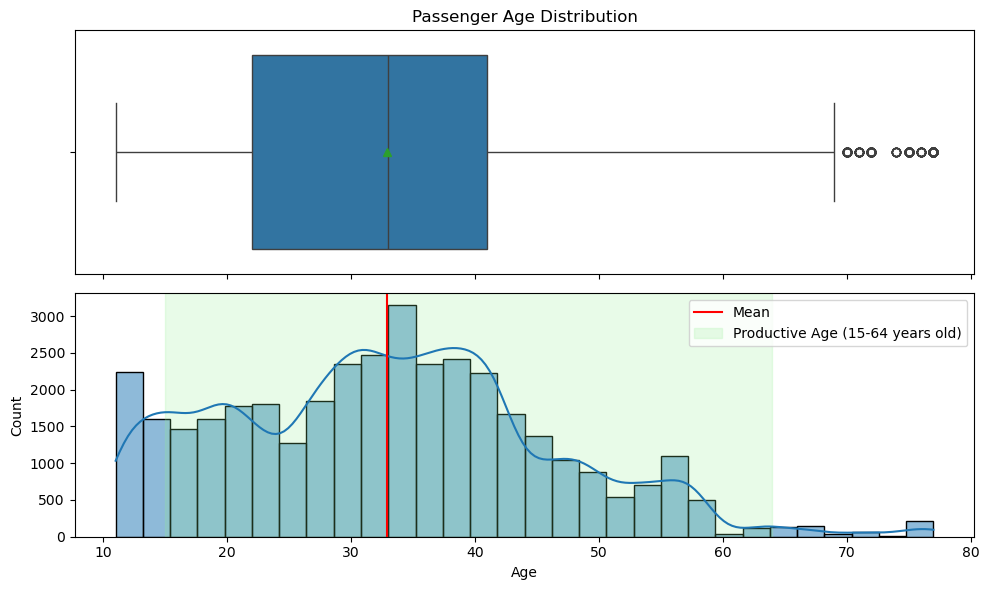

In [292]:
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
sns.boxplot(data=data, x='payCardAge', ax=ax_box, showmeans=True)
sns.histplot(data=data, x='payCardAge', ax=ax_hist, bins=30, kde=True)
ax_hist.axvline(data['payCardAge'].mean(), color='red', linestyle='-', label='Mean')
ax_hist.axvspan(15,64, color='lightgreen', alpha=0.2, label='Productive Age (15-64 years old)')
ax_box.set_title('Passenger Age Distribution')
ax_hist.set_xlabel('Age')
ax_hist.set_ylabel('Count')
ax_hist.legend()
plt.tight_layout()
plt.show()

In [293]:
#normality check

stats, pval = normaltest(data['payCardAge'])
if pval > 0.05:
        # Ho
    print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that passanger\'s age is normally distributed')
else:
        # Ha
    print(f'pvalue={pval}. We failed reject Ho. So, we could assume that passanger\'s age is NOT normally distributed')

pvalue=3.7199427151317885e-213. We failed reject Ho. So, we could assume that passanger's age is NOT normally distributed


In [294]:
q1 = np.quantile(data['payCardAge'], 0.25)
q3 = np.quantile(data['payCardAge'], 0.75)

iqr = q3-q1

productive_age = len(data[(data['payCardAge']>=15) & (data['payCardAge']<=64)])/data.shape[0]

print(f'Most of passenger\'s is in range {round(q1)}-{round(q3)} years old')
print(f'Passenger that is in productive age range made about {round(productive_age*100, 2)}% of overall trips in April 2023')
print(f'Passenger that is not in productive age range made about {round((1-productive_age)*100, 2)}% of overall trips in April 2023')

Most of passenger's is in range 22-41 years old
Passenger that is in productive age range made about 90.69% of overall trips in April 2023
Passenger that is not in productive age range made about 9.31% of overall trips in April 2023


Observations:
- The passanger's age distribution is right skewed and not normally distributed, evethough the mean and median is on similar. The dindicating a higher concentration of younger, likely productive-age individuals
- This dense ditribution around 22-41 yeard old shows that Transjakarta passenger mostly in relatively young age with a lot of daily activity

2. Analyzing Passenger Behavior through Their Trips Frequency for per Passanger

    In this part, we will analyse how many times every person using Tranjakarta as their mobility tools. If the passanger only do maximum 4 trips along April, that means they used public transportation just for occasionally trips that only happen at least once a week. but, If they do more than 4 trip in April, that means they used public transportation more frequently and probably as their daily mobility ( at least 5 trips a months)

In [295]:
pass_trip_count = pd.DataFrame(data.groupby(['payCardName', 'tapInStopsName', 'tapOutStopsName']).size().sort_values().reset_index())
pass_trip_count.rename(columns={0: 'counts'}, inplace=True)
pass_trip_count['counts'].value_counts(normalize=True).sort_values(ascending=False).head()

counts
1     0.604043
20    0.142062
19    0.109792
7     0.060089
18    0.035794
Name: proportion, dtype: float64

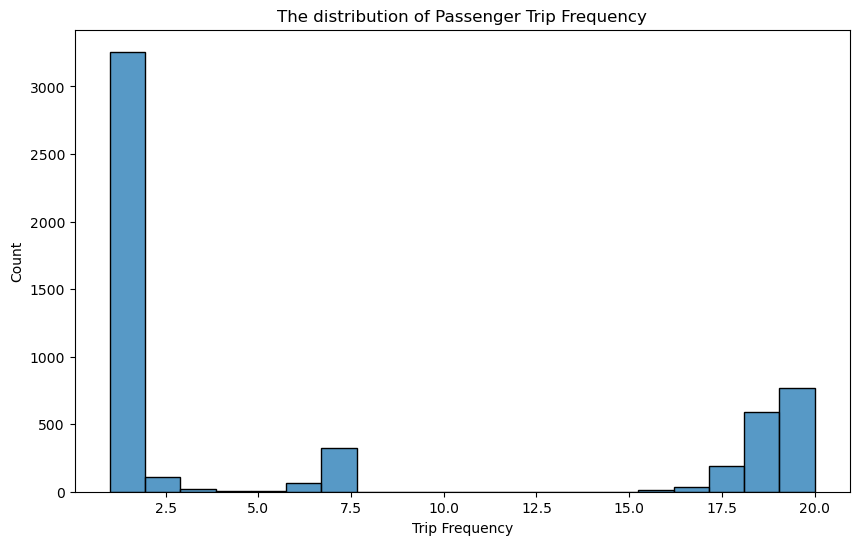

In [296]:
plt.figure(figsize=(10,6))
sns.histplot(data=pass_trip_count, x='counts', bins=20)
plt.title('The distribution of Passenger Trip Frequency')
plt.xlabel('Trip Frequency')
plt.ylabel('Count')
plt.show()

In [297]:
#occasion threshold 4 (maximum once a week)
once = pass_trip_count[pass_trip_count['counts']==1]['counts'].sum()/data.shape[0]
occasion = pass_trip_count[pass_trip_count['counts']<=4]['counts'].sum()/data.shape[0]
print(f'The occasinal trips in April 2023 is about {round(occasion*100,2)}% overall trip with the trip that only happens once is {round(once*100,2)}%')
print(f'So, the regular or frequent trips is about {round((1-occasion)*100,2)}% overall trip')

The occasinal trips in April 2023 is about 9.57% overall trip with the trip that only happens once is 8.77%
So, the regular or frequent trips is about 90.43% overall trip


Observations:
- People who used public transpostation just once in April is quite high, is about 8.77% from the total 9.57% trips that appeared 4 times. This indicating that there is a lot of passenger that haven't used public transportation as their daily mobility.
- But, most Transjakarta passanger is using public transportation as their daily mobility that is show with the 20, 19, and 18 as part of top 5 frequency. This indicating that public transportation is a really important to support people in Jakarta and surrounding to do their daily activity either going to work or school (based on the age). So, most passengers made multiple trips, supporting the idea of routine usage. This frequent public transportation use suggests their dependency for daily mobility.


3. Understanding the Time Travel per Trips

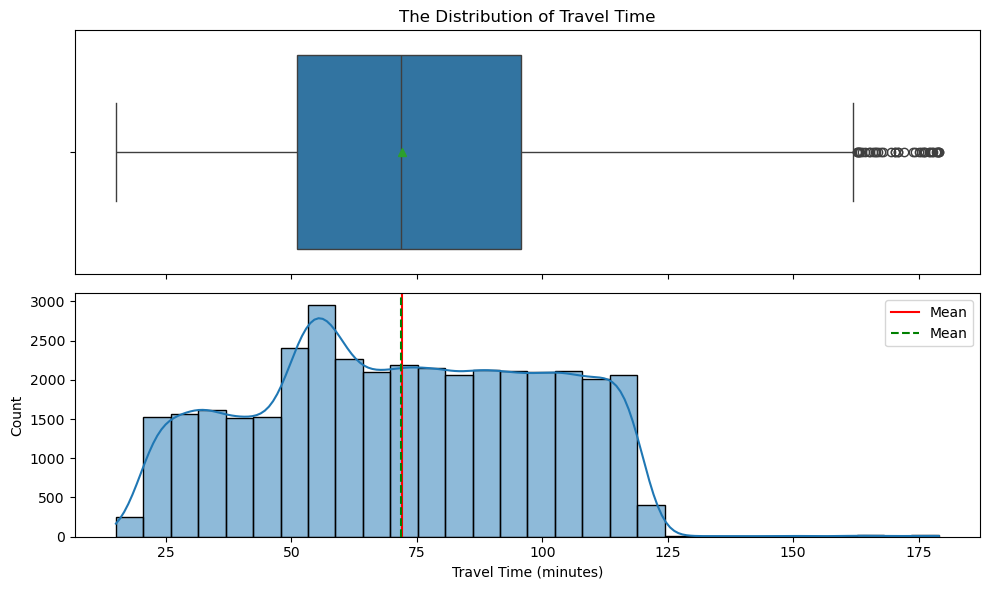

In [298]:
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
sns.boxplot(data=data, x='travelTime_in_min', ax=ax_box, showmeans=True)
sns.histplot(data=data, x='travelTime_in_min', ax=ax_hist, bins=30, kde=True)
ax_hist.axvline(data['travelTime_in_min'].mean(), color='red', linestyle='-', label='Mean')
ax_hist.axvline(data['travelTime_in_min'].median(), color='green', linestyle='--', label='Mean')
ax_hist.legend()
ax_box.set_title('The Distribution of Travel Time')
ax_hist.set_xlabel('Travel Time (minutes)')
ax_hist.set_ylabel('Count')
plt.tight_layout()
plt.show()

In [299]:
q1 = np.quantile(data['travelTime_in_min'], 0.25)
q3 = np.quantile(data['travelTime_in_min'], 0.75)

iqr = q3-q1

upper_bound = q3+(1.5*iqr)

print(f'Most of travel time is in range {round(q1)}-{round(q3)} minutes for one trip with the mean of {round(data['travelTime_in_min'].mean())} minutes')
print(f'That are trips that take extremely long time duration for each trip which longer than {round(upper_bound)} minutes')
print(f'These extremely long duration trips is about {round(len(data[data['travelTime_in_min']>upper_bound])/data.shape[0]*100, 2)}% of all trips in April 2023')

Most of travel time is in range 51-96 minutes for one trip with the mean of 72 minutes
That are trips that take extremely long time duration for each trip which longer than 162 minutes
These extremely long duration trips is about 0.11% of all trips in April 2023


In [300]:
cv = data['travelTime_in_min'].std()/data['travelTime_in_min'].mean()

if cv < 0.1:
    print(f'The coefficient of variation (CV) for travel time is {round(cv, 2)}, which indicates low variability in the duration of trips taken using Transjakarta in April 2023.')
elif cv > 1:
    print(f'The coefficient of variation (CV) for travel time is {round(cv, 2)}, which indicates high variability in the duration of trips taken using Transjakarta in April 2023.')
else:
    print(f'The coefficient of variation (CV) for travel time is {round(cv, 2)}, which indicates moderate variability in the duration of trips taken using Transjakarta in April 2023.')

The coefficient of variation (CV) for travel time is 0.39, which indicates moderate variability in the duration of trips taken using Transjakarta in April 2023.


In [301]:
#normality check

stats, pval = normaltest(data['travelTime_in_min'])
if pval > 0.05:
        # Ho
    print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that travel Time is normally distributed')
else:
        # Ha
    print(f'pvalue={pval}. We failed reject Ho. So, we could assume that travel Time is NOT normally distributed')

pvalue=0.0. We failed reject Ho. So, we could assume that travel Time is NOT normally distributed


Observations:
- Most of the trips taken with Transjakarta in April 2023 lasted between 51–96 minutes, with an average duration of 72 minutes per trip. This tells us that Transjakarta is often used for medium-to-long distance trips within the city. It suggests that public transportation is fulfilling a significant portion of users’ mobility needs for work, school, or commuting across town.
- Only about 0.11% of the trips lasted longer than 162 minutes, indicating they are rare and can be considered outliers. This align with Tte coefficient of variation (CV) for travel time is 0.39, that suggesting moderate variability in how long trips take. While there’s some variation in travel duration, it’s not chaotic. This show a positive side on how relibility Transjakarta being operated along April 2023. This relibility is crucial for people relying on it for daily commuting that needs to be on time. 
- Mean travel time is relatively stable across days that prove the system performance of Transjakarta is consistent

4. Daily Travel Patterns by Travel Time and Passanger Count

In [302]:
mean_day = data.groupby('travelDay')['travelTime_in_min'].agg(['mean','count']).reset_index()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']


mean_day['travelDay'] = pd.Categorical(mean_day['travelDay'], categories=day_order, ordered=True)

mean_day = mean_day.sort_values('travelDay').reset_index(drop=True)
mean_day

,travelDay,mean,count
0,Monday,72.166517,6730
1,Tuesday,71.751890,6725
2,Wednesday,72.521816,6718
3,Thursday,72.415669,6705
4,Friday,72.303179,6760
5,Saturday,70.266320,1739
6,Sunday,71.481476,1755


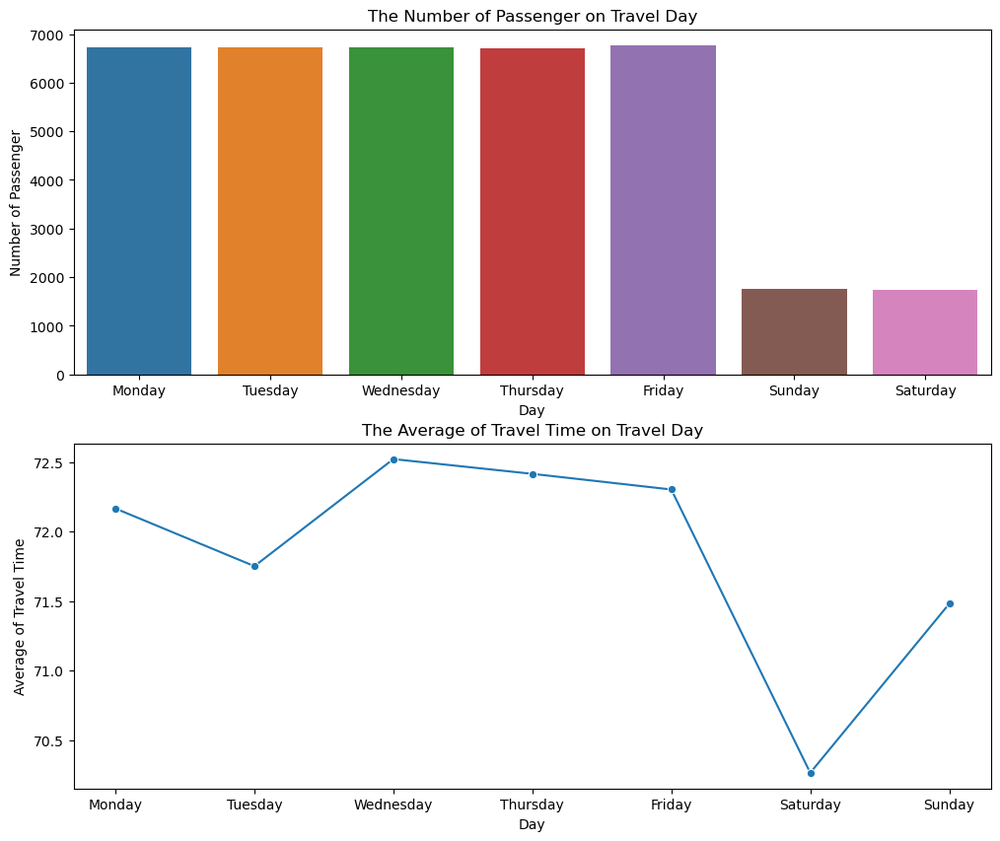

In [303]:
fg, (ax1, ax2) = plt.subplots(2,1, figsize=(12,10))
sns.countplot(data=data, x='travelDay', hue='travelDay', ax=ax1)
sns.lineplot(data=mean_day, x='travelDay', y='mean', marker='o', ax=ax2)
ax1.set_title('The Number of Passenger on Travel Day')
ax2.set_title('The Average of Travel Time on Travel Day')
ax1.set_xlabel('Day')
ax2.set_xlabel('Day')
ax1.set_ylabel('Number of Passenger')
ax2.set_ylabel('Average of Travel Time')
plt.show()

In [304]:
#normality check

for day in data['travelDay'].unique():
    stats, pval = normaltest(data['travelDay']==day)
    if pval > 0.05:
            # Ho
        print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that travel Time in {day} is normally distributed')
    else:
            # Ha
        print(f'pvalue={pval}. We failed reject Ho. So, we could assume that travel Time in {day} is NOT normally distributed')

pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Monday is NOT normally distributed
pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Tuesday is NOT normally distributed
pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Wednesday is NOT normally distributed
pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Thursday is NOT normally distributed
pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Friday is NOT normally distributed
pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Sunday is NOT normally distributed
pvalue=0.0. We failed reject Ho. So, we could assume that travel Time in Saturday is NOT normally distributed


Because of all travel time in every day is not normally distributed, so we will kruskal-wallis statistical test to check whether the mean of travel time in everyday is significantly different or similar

In [305]:
groups = [data[data['travelDay'] == day]['travelTime_in_min'] for day in day_order]

stats, pval = kruskal(*groups)

if pval > 0.05:
        # Ho
    print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that the mean of travel Time in every day is NOT significantly different')
else:
        # Ha
    print(f'pvalue={pval}. We failed reject Ho. So, we could assume that the mean of travel Time in every day is significantly different')

pvalue=0.052183788380338325. We failed to reject Ho. So, we could assume that the mean of travel Time in every day is NOT significantly different


In [306]:
day_traveltime_corr = mean_day['mean'].corr(mean_day['count'])
print("Correlation between average travel time and passenger count by tapInhour:", round(day_traveltime_corr, 3))

Correlation between average travel time and passenger count by tapInhour: 0.841


Observations: 
- The number or trips that happen between weekday much more crowded than in the weekend. This supporting our earlier insight that most people used Transjakarta for their daily mobility and rarely using it in weekend. 
- Eventhough we can see the dynamic of mean travel Time between weekday and weekend, but the mean time travel is similar whether it's on weekend or weekday. This supporting our earlier insight that Tranjakarta is reliable public transportation in terms of consistently about travel time. So, people could rely on Transjakarta whethere it's weekday when traffic is dense or in weekend where the traffic is loose
- But, the mean travel time and the number of passanger based on the day have a high correlated that is about 0.8 correlation score. This score is impact of hoq high the gap of the passanger count in weekend and weekday.

5. Time Analyze Hourly Passenger Flow on TapIn and TapOut

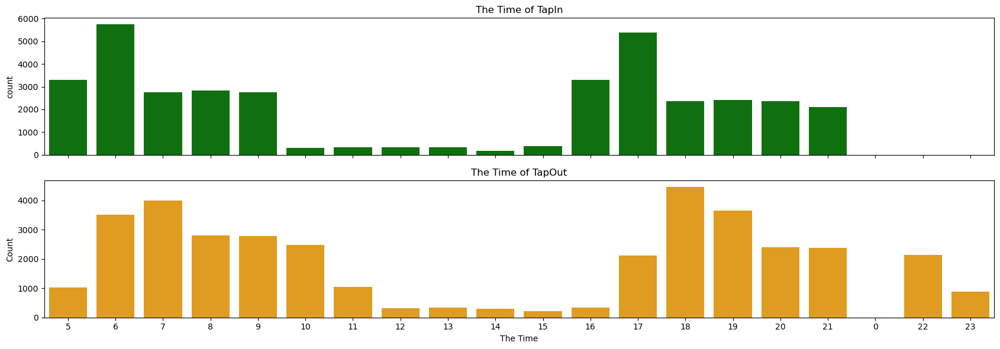

In [307]:
fig, (ax_box1, ax_box2) = plt.subplots(2, 1, figsize=(17, 6), sharex=True)
sns.countplot(data=data, x='tapInHour', ax=ax_box1, color='green')
sns.countplot(data=data, x='tapOutHour', ax=ax_box2, color='orange')
ax_box1.set_title('The Time of TapIn')
ax_box2.set_title('The Time of TapOut')
ax_box2.set_xlabel('The Time')
ax_box2.set_ylabel('Count')
plt.tight_layout()
plt.show()

Observation: 
- We can wee that most people do their trip in morning started in 5 AM and evening finished in 11 PM, with the peak is on 6-7 AM in the morning and 17-18 in the evening.
- This is the usually time where people started to go to their workplaces or school and when they go home from their workplaces or school. 

In [308]:
tapIntime_data = data.groupby(['tapInHour'])['travelTime_in_min'].agg(['mean', 'count']).reset_index()
tapOuttime_data = data.groupby('tapOutHour')['travelTime_in_min'].agg(['mean', 'count']).reset_index()

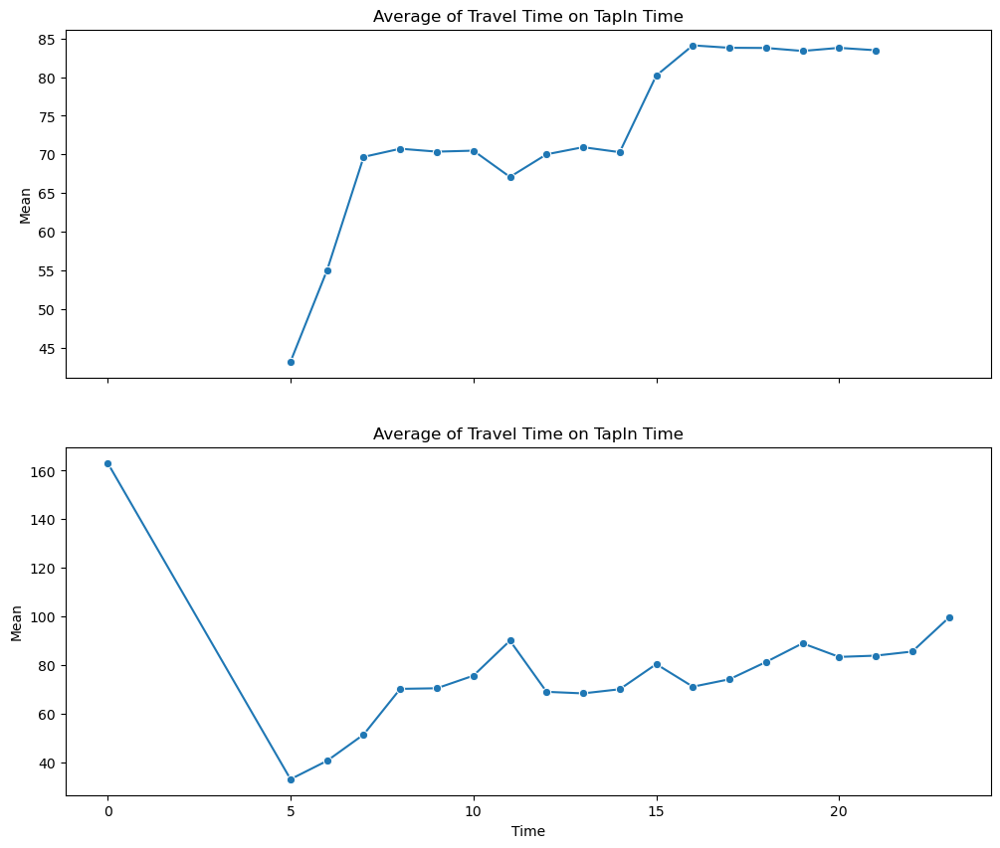

In [309]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(12,10), sharex=True)
sns.lineplot(data=tapIntime_data, x='tapInHour', y='mean', marker='o', ax=ax1)
sns.lineplot(data=tapOuttime_data, x='tapOutHour', y='mean', marker='o', ax=ax2)
ax1.set_title('Average of Travel Time on TapIn Time')
ax2.set_title('Average of Travel Time on TapIn Time')
ax2.set_xlabel('Time')
ax1.set_ylabel('Mean')
ax2.set_ylabel('Mean')
plt.show()

In [310]:
#normality check in tapInHour

for time in data['tapInHour'].unique():
    stats, pval = normaltest(data['travelDay']==time)
    if pval > 0.05:
            # Ho
        print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that travel Time when the tapInHour on {time} o\'clock is normally distributed')
    else:
            # Ha
        print(f'pvalue={pval}. We failed reject Ho. So, we could assume that travel Time when the tapInHour on {time} o\'clock is NOT normally distributed')

pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 5 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 6 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 17 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 16 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 8 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 7 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour on 9 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapInHour

In [311]:
#normality check in tapOutHour

for time in data['tapOutHour'].unique():
    stats, pval = normaltest(data['travelDay']==time)
    if pval > 0.05:
            # Ho
        print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that travel Time when the tapOutHour on {time} o\'clock is normally distributed')
    else:
            # Ha
        print(f'pvalue={pval}. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on {time} o\'clock is NOT normally distributed')

pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 6 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 5 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 7 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 19 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 18 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 17 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the tapOutHour on 8 o'clock is NOT normally distributed
pvalue=nan. We failed reject Ho. So, we could assume that travel Time when the t

Because of all travel time in all tapInHour and tapOutHour is not normally distributed, so we will kruskal-wallis statistical test to check whether the mean of travel time in every hour is significantly different or similar

In [312]:
traveltime_tapin_hour = [data[data['tapInHour'] == hour]['travelTime_in_min'] for hour in range (5,22,1)]

stats, pval = kruskal(*traveltime_tapin_hour)

if pval > 0.05:
        # Ho
    print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that the travel Time in every tap in hour is NOT significantly different')
else:
        # Ha
    print(f'pvalue={pval}. We failed reject Ho. So, we could assume that the travel Time in every tap in hour is significantly different')

pvalue=0.0. We failed reject Ho. So, we could assume that the travel Time in every tap in hour is significantly different


In [313]:
traveltime_tapout_hour = [data[data['tapOutHour'] == hour]['travelTime_in_min'] for hour in range (5,22,1)]

stats, pval = kruskal(*traveltime_tapout_hour)

if pval > 0.05:
        # Ho
    print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that the travel Time in every tap out hour is NOT significantly different')
else:
        # Ha
    print(f'pvalue={pval}. We failed reject Ho. So, we could assume that the travel Time in every tap out hour is significantly different')

pvalue=0.0. We failed reject Ho. So, we could assume that the travel Time in every tap out hour is significantly different


In [314]:
tapIn_traveltime_corr = tapIntime_data['mean'].corr(tapIntime_data['count'])
tapOut_traveltime_corr = tapOuttime_data['mean'].corr(tapOuttime_data['count'])
print("Correlation between average travel time and passenger count by tapInhour:", round(tapIn_traveltime_corr, 3))
print("Correlation between average travel time and passenger count by tapOuthour:", round(tapOut_traveltime_corr, 3))

Correlation between average travel time and passenger count by tapInhour: -0.103
Correlation between average travel time and passenger count by tapOuthour: -0.293


Observations:
- We know that the trip peak hour is on morning and evening have probably on the similar level. but, the travel time getting longer in the evening, either on tapInHour or in tapOutHour
- From the kruskal also show that the mean of travel Time in tapInHour and tapOutHour is significantly different. But, this is not correlated with the number of passanger. The longer of the travel time probably being impacted with the traffic situation that getting more dense in the evening than in the morning. 
- This traffic situation might be getting dense because in the evening most people is on their travel to go home. So, they don't have to be hurry or arrive on the specific time, unlike in the morning when people go to their workplaces or school.

5. Corridor-Level Analysis by Travel Time and Passanger Count

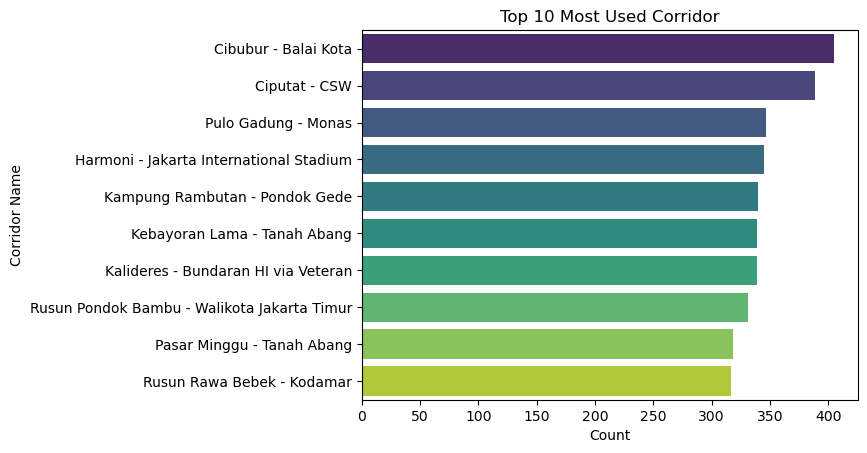

In [315]:
top_corridor = data['corridorName'].value_counts().sort_values(ascending=False).head(10)
sns.barplot(x=top_corridor.values, y=top_corridor.index, hue=top_corridor.index, palette='viridis')
plt.title('Top 10 Most Used Corridor')
plt.xlabel('Count')
plt.ylabel('Corridor Name')
plt.show()

Observations: 
- This most crowded corridor show the pattern of most people trip are ommuter heavy that is indicate Daily home–work/school trips from suburbs or affordable housing zones.
- This top corridor also shows everyday high demand for access to central Jakarta, where the most office, goverment services, and many kind of big event located.
- These routes also reflect socioeconomic segmentation, where low- to middle-income groups that lived in the edges of Jakarta rely heavily on TransJakarta for long-haul commuting.

In [316]:
mean_traveltime = data.groupby('corridorName')['travelTime_in_min'].agg(['mean','count']).reset_index()
mean_traveltime

,corridorName,mean,count
0,Andara - Stasiun Universitas Pancasila,69.684486,243
1,BKN - Blok M,74.336581,313
2,BSD - Jelambar,69.946667,126
3,BSD Serpong - Fatmawati,76.978065,93
4,Batusari - Grogol,71.444651,258
...,...,...,...
211,Terminal Rawamangun - Cipinang Muara,75.948502,207
212,Terminal Tanah Merah - Pulo Gadung,71.714552,268
213,Terminal Tanjung Priok - Ancol Barat,69.725879,199
214,Tongtek - Tebet Eco Park (TEP) - Cililitan,65.950000,170


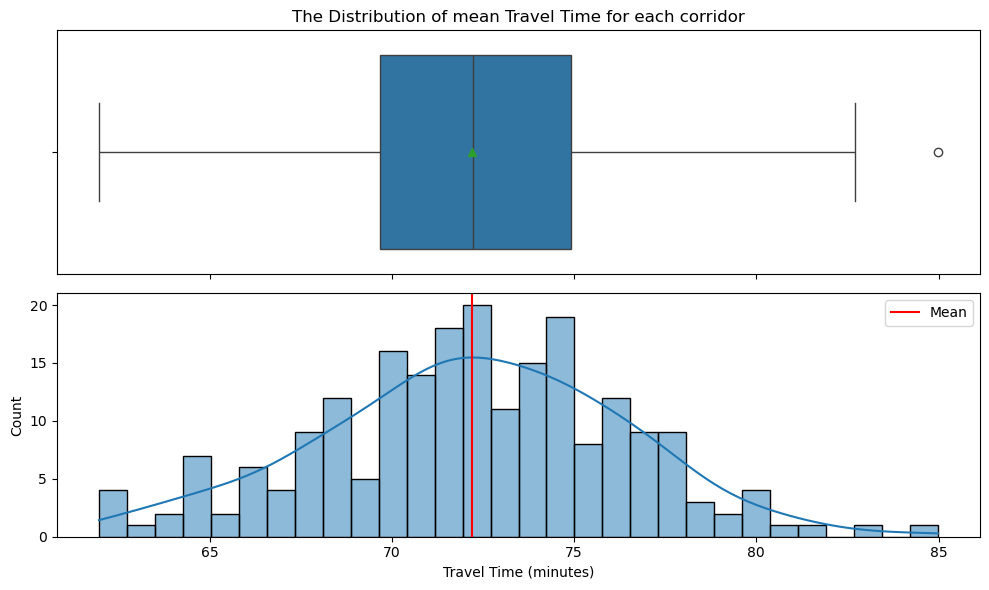

In [317]:
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
sns.boxplot(data=mean_traveltime, x='mean', ax=ax_box, showmeans=True)
sns.histplot(data=mean_traveltime, x='mean', ax=ax_hist, bins=30, kde=True)
ax_hist.axvline(mean_traveltime['mean'].mean(), color='red', linestyle='-', label='Mean')
ax_hist.legend()
ax_box.set_title('The Distribution of mean Travel Time for each corridor')
ax_hist.set_xlabel('Travel Time (minutes)')
ax_hist.set_ylabel('Count')
plt.tight_layout()
plt.show()

In [318]:
#normality check

stats, pval = normaltest(mean_traveltime['mean'])
if pval > 0.05:
        # Ho
    print(f'pvalue={pval}. We failed to reject Ho. So, we could assume that the mean of travel Time in each corridor is normally distributed')
else:
        # Ha
    print(f'pvalue={pval}. We failed reject Ho. So, we could assume that the mean of travel Time in each corridor is NOT normally distributed')

pvalue=0.9162967626963514. We failed to reject Ho. So, we could assume that the mean of travel Time in each corridor is normally distributed


In [319]:
cv = mean_traveltime['mean'].std()/mean_traveltime['mean'].mean()

if cv < 0.1:
    print(f'The coefficient of variation (CV) for travel time is {round(cv, 2)}, which indicates low variability in the duration of trips taken using Transjakarta in April 2023.')
elif cv > 1:
    print(f'The coefficient of variation (CV) for travel time is {round(cv, 2)}, which indicates high variability in the duration of trips taken using Transjakarta in April 2023.')
else:
    print(f'The coefficient of variation (CV) for travel time is {round(cv, 2)}, which indicates moderate variability in the duration of trips taken using Transjakarta in April 2023.')

The coefficient of variation (CV) for travel time is 0.06, which indicates low variability in the duration of trips taken using Transjakarta in April 2023.


In [320]:
mean_traveltime_corr = mean_traveltime['mean'].corr(mean_traveltime['count'])
print("Correlation between average travel time and passenger count by hour:", round(mean_traveltime_corr, 3))

Correlation between average travel time and passenger count by hour: -0.047


Observations:
- On earlier time travel analyze, even though that they are in a moderate variability and not normally distributed, but the mean of travel time based on the corridor is normally distibuted and having low variability. This indicated despiter the travel time for each trip is quite vary, but it stabile based on the route. This explained how efficient and reliable Transjakarta service as a public transportation
- We also can see that even though some corridor served many people, but the correlation between the mean trave time and the passanger count is really low. Or, we can say that the crowedness of the corridor doesn't really impactful with the travel time. 

6. Stop-Level Analysis by Stop Crowd Rank and Spatial Distribution of Bus Stops (Folium)

In terms of finding the most crowd bus stops, we will combine the passanger number in tapIn and tapOut

In [321]:
tap_in_Stops = data['tapInStopsName'].value_counts().sort_values(ascending=False)
tap_out_Stops = data['tapOutStopsName'].value_counts().sort_values(ascending=False)
Stops_rank = pd.concat([tap_in_Stops, tap_out_Stops], axis=1)
Stops_rank.columns = ['tapIn', 'tapOut']
Stops_rank['total'] = Stops_rank['tapIn'] + Stops_rank['tapOut']
top_Stops = Stops_rank.sort_values(by='total', ascending=False).head(10)

In [322]:
top_Stops.index.to_list()

['Penjaringan',
 'BKN',
 'BNN LRT',
 'Cibubur Junction',
 'Tendean',
 'Rusun Kapuk Muara',
 'Kejaksaan Agung',
 'Garuda Taman Mini',
 'Penggilingan',
 'Monas']

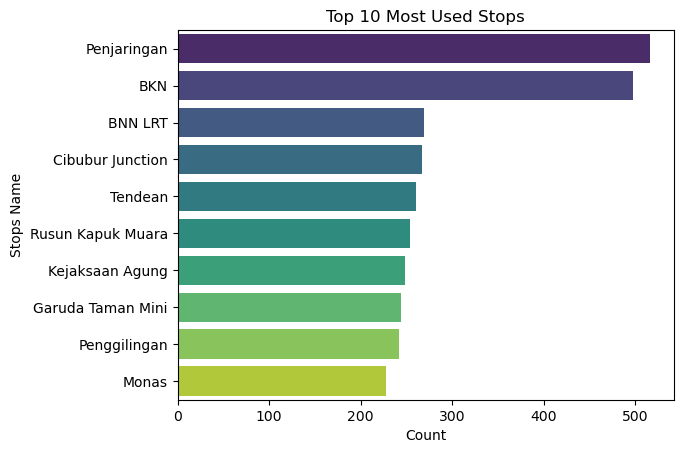

In [323]:
sns.barplot(x=top_Stops['total'].values, y=top_Stops.index, hue=top_Stops.index, palette='viridis')
plt.title('Top 10 Most Used Stops')
plt.xlabel('Count')
plt.ylabel('Stops Name')
plt.show()

In [324]:
morning_pattern = pd.DataFrame(data[data['tapInHour']<12].groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index())
morning_pattern.rename(columns={0: 'counts'}, inplace=True)
morning_pattern.sort_values(by='counts', ascending=False).head(10)

,tapInStopsName,tapOutStopsName,counts
336,Garuda Taman Mini,BKN,99
1492,Rusun Kapuk Muara,Penjaringan,98
2204,Walikota Jakarta Timur,Penggilingan,62
365,Gelora Bung Karno 1,Bundaran Senayan 1,58
1210,Penjaringan,Rusun Penjaringan,44
680,Jln. Limo Jatinegara Timur,Sekolah Cahaya Sakti Otista I,43
59,BKN,Cibubur Junction,41
1898,Simpang Danau Sunter Utara Barat,Jembatan Item,40
520,Jatibening 1,Cawang Blue Bird,40
1124,Pademangan,Ancol,39


In [325]:
evening_pattern = pd.DataFrame(data[data['tapInHour']>12].groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index())
evening_pattern.rename(columns={0: 'counts'}, inplace=True)
evening_pattern.sort_values(by='counts', ascending=False).head(10)

,tapInStopsName,tapOutStopsName,counts
1427,Penjaringan,Rusun Kapuk Muara,97
2482,Tanah Merdeka Arah Timur,Kampung Rambutan,78
266,Cibubur Junction,BKN,65
386,Garuda Taman Mini,Pinang Ranti,62
1422,Penggilingan,Rusun Komarudin,60
1764,Rusun Penjaringan,Penjaringan,47
9,Adam Malik,Puri Beta 2,42
1705,RSPAD 1,Term. Senen,41
144,Bintaro Xchange,St. MRT Fatmawati,41
1096,Kuningan Madya 2,Menara Duta,40


Observations: 
Morning: Home → Work/School
- Strong presence of government workers, students, and local laborers.
- Movements from residential edges toward economic/government hubs.

Evening: Work → Home
- Reinforces socio-economic segmentation (rusun residents returning).
- Long commutes home show dependence on TransJakarta for affordability, even in long-distance, higher-fare routes.
- High-use tap patterns suggest areas with dense population, affordable housing including in outer Jakarta residential area, or key job centers. These zones may benefit from more frequent services, better infrastructure, or policy attention.

Bus Stops Location

In [326]:
#make merge of stops rank dataframe and the coordinate
stops_merge = pd.merge(Stops_rank, data[['tapInStopsName', 'tapInStopsLon', 'tapInStopsLat']], left_index=True, right_on='tapInStopsName', how='outer')
stops_merge = pd.merge(stops_merge, data[['tapOutStopsName', 'tapOutStopsLon', 'tapOutStopsLat']], left_on='tapInStopsName', right_on='tapOutStopsName', how='outer')
stops_merge.drop_duplicates(inplace=True)

#fill the missing value in merge dataframe
stops_merge['tapIn'] = stops_merge['tapIn'].fillna(0)
stops_merge['tapOut'] = stops_merge['tapOut'].fillna(0)
stops_merge['total'] = stops_merge['tapIn'] + stops_merge['tapOut']
stops_merge['tapInStopsLon'] = stops_merge['tapInStopsLon'].fillna(stops_merge['tapOutStopsLon'])
stops_merge['tapInStopsLat'] = stops_merge['tapInStopsLat'].fillna(stops_merge['tapOutStopsLat'])
stops_merge.drop(columns=['tapOutStopsName', 'tapOutStopsLon', 'tapOutStopsLat'], inplace=True)

#rename the merge dataframe 
stops_merge = stops_merge.rename(columns={
    'tapInStopsName':'StopsName',
    'tapInStopsLon':'StopsLon',
    'tapInStopsLat':'StopsLat'
    })
stops_merge

,tapIn,tapOut,total,StopsName,StopsLon,StopsLat
0,19.0,0.0,19.0,18 Office Park,106.832100,-6.299146
19,0.0,2.0,2.0,ABA,106.839390,-6.194149
21,1.0,1.0,2.0,ACC Simatupang,106.848580,-6.304475
22,7.0,1.0,8.0,ACE Hardware,106.827380,-6.387532
29,1.0,0.0,1.0,AKR Tower,106.767430,-6.190732
...,...,...,...,...,...,...
946148,1.0,20.0,21.0,Yayasan Perguruan Rakyat 2,106.898620,-6.228468
946168,18.0,1.0,19.0,Yon Arhanud - 10 Pesanggrahan,106.756260,-6.258076
946186,1.0,3.0,4.0,Yos Sudarso Kodamar,106.881690,-6.162043
946189,0.0,2.0,2.0,Yos Sudarso Kodamar 1,106.881525,-6.162050


In [327]:
# Create map
map_jakarta = folium.Map(location=[-6.2, 106.8], zoom_start=11)
marker_cluster = MarkerCluster().add_to(map_jakarta)

for _, row in stops_merge.iterrows():
    folium.Marker(
        location=[row['StopsLat'], row['StopsLon']],
        popup=row['StopsName'],
        icon=folium.Icon(color='blue', icon='bus', prefix='fa')
    ).add_to(marker_cluster)

# Add top stops separately in red
top_stops = top_Stops.index.to_list()  
for _, row in stops_merge[stops_merge['StopsName'].isin(top_stops)].iterrows():
    folium.Marker(
        location=[row['StopsLat'], row['StopsLon']],
        popup=f"TOP STOP: {row['StopsName']}",
        icon=folium.Icon(color='red', icon='star')
    ).add_to(map_jakarta)

In [328]:
map_jakarta

Observations:
- We can see that most bus stops is consentrated in the center Jakarta where most people workplaces located. This make a high demand route to many places in central Jakarta
- We also can see that the most crowd bus stops is formed a straight line in the central Jakarta from north (Penjaringan) to the south (Cibubur Junction) with added in the east (Penggilingan)
- This top stops also tell us there high demand of public transportation in north, central, south, and east

7. Royal Fare Trip Analysis

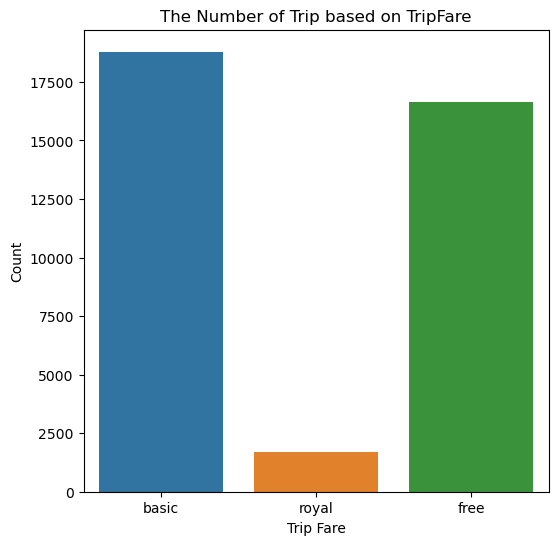

In [329]:
plt.figure(figsize=(6, 6)) 
sns.countplot(data=data, x='tripFare', hue='tripFare')
plt.title('The Number of Trip based on TripFare')
plt.xlabel('Trip Fare')
plt.ylabel('Count')
plt.show()

In [330]:
data['tripFare'].value_counts(normalize=True)

tripFare
basic    0.505925
free     0.447862
royal    0.046214
Name: proportion, dtype: float64

In [331]:
print('The proportion of corridor count for each fare ')

for i in data['tripFare'].unique().tolist():
    perc = data[data['tripFare']==i]['corridorName'].nunique()/data['corridorName'].nunique()
    print(f'The number of corridor in {i} fare is about {round(perc*100,2)}% of all corridor')

The proportion of corridor count for each fare 
The number of corridor in basic fare is about 49.07% of all corridor
The number of corridor in royal fare is about 4.63% of all corridor
The number of corridor in free fare is about 46.3% of all corridor


Observation:
- Transjakarta has a premium service called royaltrans that has fare way higher than the basic which is 20000 while the basic only 3500. This premium service give more convinient facility in their bus like more convinient chair, electricity, soundsystem, more space, etc.
- Like the common premium service in any industry, premium service only served in a small proportion which only 5% of all trips in April 2023, where most of the trips is in basic and free fare.
- This small proportion is align with the number of corridor that served this public transportation premium version. Royaltrans only served 4.63% of overall the number of corridor.
- But, we will dig deeper to understand more about the target of this premium service

In [332]:
royal_trip = data[data['tripFare']=='royal']
royal_trip['corridorName'].value_counts()

corridorName
Cibubur - Balai Kota             405
Bekasi Barat - Kuningan          229
Cinere - Bundaran Senayan        184
Palem Semi - Bundaran Senayan    181
Cibubur Junction - Blok M        161
Bintaro - Fatmawati              150
Bekasi Barat - Blok M            128
Cibubur - Kuningan                95
BSD Serpong - Fatmawati           93
Cinere - Kuningan                 90
Name: count, dtype: int64

Observations:
- Even though only ~5% of all trips are on royal fare routes but we can see that the most crowd corridor, Cibubur-Balai Kota, is Royaltrans
- Royaltrans routes are long, often intercity, so comfort and speed matter.
- They serve middle to upper-middle income commuters in suburban areas who likely prefer a stress-free trip over the cost.
- Compared to fuel, toll, and parking for cars, 20000 is cheap.
- Many are first stop or last stop connected with shuttle services, LRT, or housing complexes.
- So, eventhough most of Transjakarta passanger is in low-middle social economy class, there are middle to upper-middle class who also used Transjakarta. This explained why the top corridor is in royal fare because 20000 is still cheap and relatively small amouny to the middle to upper-middle class, especially compared to the convenient that they gave. 
- So, people who use royal fare routes because they value time efficiency, comfort during long commutes, and direct to the high-quality access to core business districts and transport hubs

8. Identifying Service Gaps & Opportunities

In this part we will see the bus stops position and the crowdness 

In [334]:
#set map jakarta
m = folium.Map(location=[-6.2, 106.8], zoom_start=11)

#create layer groups
heatmap_layer = folium.FeatureGroup(name='Passenger Density Heatmap').add_to(m)
marker_layer = folium.FeatureGroup(name='Bus Stop Locations').add_to(m)

# add heatmap
heat_data = [[row['StopsLat'], row['StopsLon']] for index, row in stops_merge.iterrows()]
HeatMap(heat_data, radius=15).add_to(heatmap_layer)

# add mark cluter to bus stop
marker_cluster = MarkerCluster().add_to(marker_layer)

for index, row in stops_merge.iterrows():
    folium.Marker(
        location=[row['StopsLat'], row['StopsLon']],
        popup=row['StopsName'],
        icon=folium.Icon(color='blue', icon='bus', prefix='fa')
    ).add_to(marker_cluster)

#add top stops separatedly in red
top_stops = top_Stops.index.to_list()
for _, row in stops_merge[stops_merge['StopsName'].isin(top_stops)].iterrows():
    folium.Marker(
        location=[row['StopsLat'], row['StopsLon']],
        popup=f"TOP STOP: {row['StopsName']}",
        icon=folium.Icon(color='red', icon='star')
    ).add_to(m)

#add layer control
folium.LayerControl().add_to(m)

#show the map
m

Observation:
- We can see that there are a high density crowdness in east side, but ths bust stops ended in Cibubur Junction or Bulak Kapal
- Since around Kranggan, Kota Wisata, Bengkong, Mutiara Gading and Grand Wisata now is a dense residential, so this side is have more chance to the area of expanding the covering of Transjakarta Bus Stops.
- Actually, on the west side there are hole or uncovering area around Sudimara Pinang, Tajur, Parigi Baru, and Parigi. But the heatmap show that this area haven't show the high demand
- The high demand may also shows in the north side. But, there no more land there.
- So, the south east area is the more apropriate direction to expanding the covering area of Transjakarta because of the high crowdness and the location that is close with residential area

9. Route & Stop Recommendation
- Kranggan : new stops as extension of Cibubur Junction-Balai Kota corridor (Royaltrans)
    Kranggan is new middle-upper middle residential area where people started to buy house there. The location isn't really far from Cibubur Junction stops and connected with Jalan Transyogi. So, it's posible to add this new stops as the extension of this route
- Kota Wisata : direct route to MRT Fatmawati (Royaltrans)
    As the middle-upper middle residentia area, it will be really helpful if there are direct route to MRT Fatmawati, so people could easily direct commuter to any business district area around MRT station. Besides, from Kota Wisata, the bus could directly routing through Cimanggis-Cibitung high way road (jalan tol)
- Grand Wisata : direct route to Kuningan (Royaltrans)
    The needed context of Grand Wisata is also similar with Kota Wisata. This is the upper-middle residential area, so it;s suitable with the Royaltrans target passanger. And with the location, its possible to open new direct route to Kuningan, the central busines district, through Tambun, Bekasi Timur, Bekasi Barat, and Pondok Gede
- Lubang Buaya, Bengkong, Mutiara Gading, Bojong Menteng : new route to Pinang Ranti (basic or free fare)
    This area is dense lower to middle residential area that show the needed for the covering bu stops, so they don't have to go to Bulak Kapal area or Cibubur Junction area to go to central Jakarta. make a new diret route around this area to go to Pinang Ranti will also help them to transit to another route without have to make a direct long route. 

## Conclusion:

- Transjakarta as the only public transportation provider that is owned by the Jakarta local goverment has been played a really important role for supporting many people daily commuting on their important activity like work, school, or even the occasionally trip
- Nowadays, there are a lot of type of public transportation type in Jakarta, not only bus, but also train, MRT, and LRT. The government has been improved on this public transportation serviced by integrated all of those kind of public transportation that made this cheap, fast, and convinient mobility became accesible to all kind of social economic class. Not, only for low-middle class, but also for middle-upper middle class
- Because of the important role of public transportation in supporting many people daily activity, improving or expanding covering area is really important to give more people easier acces and more choice to how they want to commute. Besides, Jakarta is known for the high traffic, so make more people expose to closer public transportation access could enforce them to use public transportation that their own private car that hopefully could reduce the traffic. 
- So, opening new stops, make new route to all kind of residential class will be a great improvement to Transjakarta in process of became smart city. 